## Initial setup
This analysis using ema is based on the work of Enayat A. Moallemi created on 22 May 2018 at the Fraunhofer ISI, Karlsruhe. In that instance, the analysis was done for the MATISSE model.
This notebook present a first stage on a SA and UA. It is a screening process using the Elementary Effects Test (EET). For this, The EMA workbench is used with SAlib Morris sampler.


In [3]:

'''
By Angela M. Rojas A. <angelara@student.unimelb.edu.au>

Created on 18 December 2019

'''
import sys
import os

sys.path.append(r'C:\Users\angel\Documents\GitHub\gr4sp\experiments\EMAworkbench')

sys.path.append(r'C:\Users\angel\Documents\GitHub\gr4sp\experiments')

#from ema_workbench.analysis.plotting_util import BOXPLOT, KDE, VIOLIN
from ema_workbench.analysis.plotting import envelopes
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import matplotlib.cm as cm
import seaborn as sns
from ema_workbench.analysis import prim
#import pareto
import os
import glob
import numpy as np
import pandas as pd
import os
import glob

includePlots = True

## Load the results
These results are a tuple of one data frame with the changes on each input variable, and a dictionary with the outputs. 

In [4]:
from ema_workbench import load_results
#AfterbaseYear resutls: last results Dec 02 2020
#results = load_results(r'C:/Users/angel/Documents/GitHub/gr4sp/experiments/simulationData/gr4sp_EET2020ABY-Dec-02.tar.gz')

#Before and after base year results: last results on Jan 14 2021
results = load_results(r'C:/Users/angel/Documents/GitHub/gr4sp/experiments/simulationData/gr4sp_EETPast2021-Jan-14.tar.gz')


In [5]:
experiments, outcomes = results

# Create a temporary copy of dictionary, with Outcomes Year
outcomesYear = dict(outcomes)

keysToRemove = [] 
# Iterate over the temporary dictionary and delete corresponding key from original dictionary
for (key, value) in outcomesYear.items() :
    if 'Month' in key:
        keysToRemove.append(key)
        
for k in keysToRemove:        
    del outcomesYear[k]   
    
        

In [6]:
experiments.describe()

,annualCpi,annualInflation,domesticConsumptionPercentage,generationRolloutPeriod,generatorRetirement,importPriceFactor,includePublicallyAnnouncedGen,learningCurve,nameplateCapacityChangeBattery,nameplateCapacityChangeBrownCoal,...,priceChangePercentageBrownCoal,priceChangePercentageCcgt,priceChangePercentageOcgt,priceChangePercentageSolar,priceChangePercentageWater,priceChangePercentageWind,scheduleMinCapMarketGen,semiScheduleMinCapMarketGen,technologicalImprovement,wholesaleTariffContribution
count,7000.000000,7000.000000,7000.00000,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000,...,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000
mean,2.664714,2.709286,38.06400,4.950286,-0.032286,-0.351429,0.257000,7.248857,1.340000,-1.848571,...,0.617143,-0.060000,-0.634286,-0.985714,-0.574286,-0.622857,20.257143,14.847534,8.156143,26.250000
std,1.445692,1.463340,12.66755,3.748614,3.643977,37.688490,0.437011,5.343287,35.933116,35.541008,...,35.866858,36.219345,35.419200,35.270470,36.450789,35.593240,7.227936,11.116881,5.479003,12.724411
min,1.000000,1.000000,20.00000,0.000000,-5.000000,-50.000000,0.000000,0.000000,-50.000000,-50.000000,...,-50.000000,-50.000000,-50.000000,-50.000000,-50.000000,-50.000000,10.000000,0.100000,0.000000,10.000000
25%,1.000000,2.000000,34.00000,0.000000,-5.000000,-50.000000,0.000000,0.000000,-10.000000,-50.000000,...,-10.000000,-50.000000,-50.000000,-50.000000,-50.000000,-50.000000,18.000000,0.100000,6.000000,10.000000
50%,3.000000,2.000000,41.00000,6.000000,1.000000,-10.000000,0.000000,6.000000,10.000000,-10.000000,...,10.000000,-10.000000,10.000000,10.000000,10.000000,10.000000,22.000000,12.060000,9.000000,24.000000
75%,3.000000,3.000000,55.00000,10.000000,5.000000,50.000000,1.000000,9.000000,50.000000,10.000000,...,10.000000,50.000000,10.000000,10.000000,10.000000,10.000000,30.000000,30.000000,15.000000,31.000000
max,5.000000,5.000000,55.00000,10.000000,5.000000,50.000000,1.000000,15.000000,50.000000,50.000000,...,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,30.000000,30.000000,15.000000,45.000000


The outcomes are shown in year. Though another analysis can be done for monthly outcomes. 
In total (Jul 2020), there are 30 uncertain inputs (previous version 33 levers). 
Updated version (August 2020) included another input for the analysis. Therefore bringing the number of 31 inputs for the EET. The new input is to represent the changes on percentage of domestic consumption, as it was assumed to be an average of 30% during the whole simulation, but it is currently at 22% so this variability had to be checked. 
The Sep-Oct 2020 version has the same number of uncertainties, however another EET was run given that changes to nominal values and uncertanty ranges were made.

In [7]:
#outcomes Options: wholesalePriceYear, GHGYear, tariffsYear, primarySpotProductionYear,
# secondarySpotProductionYear, offSpotProductionYear, rooftopPvProductionYear
# numActorsYear
outcomes_to_show =  ['consumptionYear', 'tariffsYear', 'wholesalePriceYear', 'GHGYear', 
                    'primarySpotProductionYear', 'secondarySpotProductionYear', 
                    'offSpotProductionYear', 'renewableContributionYear', 'rooftopPVProductionYear', 
                    'coalProductionYear', 'waterProductionYear', 'windProductionYear', 'gasProductionYear', 
                    'solarProductionYear', 'BatteryProductionYear', 'primaryUnmetDemandMwh', 'primaryUnmetDemandHours',
                    'primaryUnmetDemandDays', 'primaryMaxUnmetDemandMwhPerHour', 'secondaryUnmetDemandMwh',
                    'secondaryUnmetDemandHours', 'secondaryUnmetDemandDays','secondaryMaxUnmetDemandMwhPerHour']

uncertainties = experiments.columns[:-3]
#levers = ['rooftopPV', 'solarUptake']

#from startYear
startYear = 1998
startYearShift = (startYear - 1998)
#startYearShift = (startYear - 1997) * 12
#time = outcomes['TIMEYear'][0, startYearShift:-31]
time = outcomes['TIMEYear'][0, startYearShift:]
#index = pd.to_datetime(time, format = '%Y-%m-%d')
index = pd.to_datetime(time, format = '%Y')

for u in uncertainties:
    var = experiments[u]
    val = np.unique(var)
    print("{}: {}".format(u,val))

annualCpi: [1. 2. 3. 5.]
annualInflation: [1. 2. 3. 5.]
consumption: ['Central' 'Fast change' 'High DER' 'Slow change']
domesticConsumptionPercentage: [20. 34. 41. 55.]
energyEfficiency: ['Central' 'Slow change' 'Step change']
generationRolloutPeriod: [ 0.  4.  6. 10.]
generatorRetirement: [-5. -1.  1.  5.]
importPriceFactor: [-50. -10.  10.  50.]
includePublicallyAnnouncedGen: [0. 1.]
learningCurve: [ 0.  6.  9. 15.]
nameplateCapacityChangeBattery: [-50. -10.  10.  50.]
nameplateCapacityChangeBrownCoal: [-50. -10.  10.  50.]
nameplateCapacityChangeCcgt: [-50. -10.  10.  50.]
nameplateCapacityChangeOcgt: [-50. -10.  10.  50.]
nameplateCapacityChangeSolar: [-50. -10.  10.  50.]
nameplateCapacityChangeWater: [-50. -10.  10.  50.]
nameplateCapacityChangeWind: [-50. -10.  10.  50.]
nonScheduleGenSpotMarket: ['none' 'primary' 'secondary']
nonScheduleMinCapMarketGen: [ 0.1   6.06  9.04 15.  ]
onsiteGeneration: ['Central' 'Slow change' 'Step change']
priceChangePercentageBattery: [-50. -10.  

## EET
To obtain the SALib results for each input

In [18]:
from gr4spModelEET import getModel
from ema_workbench.em_framework.salib_samplers import get_SALib_problem
from ema_workbench.em_framework.samplers import determine_parameters
from EMAworkbench.ema_workbench import (IntegerParameter, RealParameter, CategoricalParameter, BooleanParameter)

model = getModel()
UncertaintiesCategories = determine_parameters(model, 'uncertainties', union=False) 
problem = get_SALib_problem(UncertaintiesCategories)

# Build input values as floats used for each lever/uncertainty to generate outcomes. Recover them from experiments variable
X = None
for u in uncertainties:
    col_cat = None
    # map category to an index
    if isinstance(model.uncertainties[u], CategoricalParameter):
        col_cat = [ float(model.uncertainties[u].index_for_cat(cat)) for cat in experiments[u] ]
    else:
        col_cat = [ float(cat) for cat in experiments[u] ]
    
    # Concatenate each lever/uncertainty
    if X is None:
        X=col_cat
    else:
        X = np.column_stack((X,col_cat))



## Analysis of EET
The analyse method from SALib helps in the identification of the key sensitivity measures: mu, mu*, and sigma

consumptionYear


AttributeError: 'AxesSubplot' object has no attribute 'suptitle'

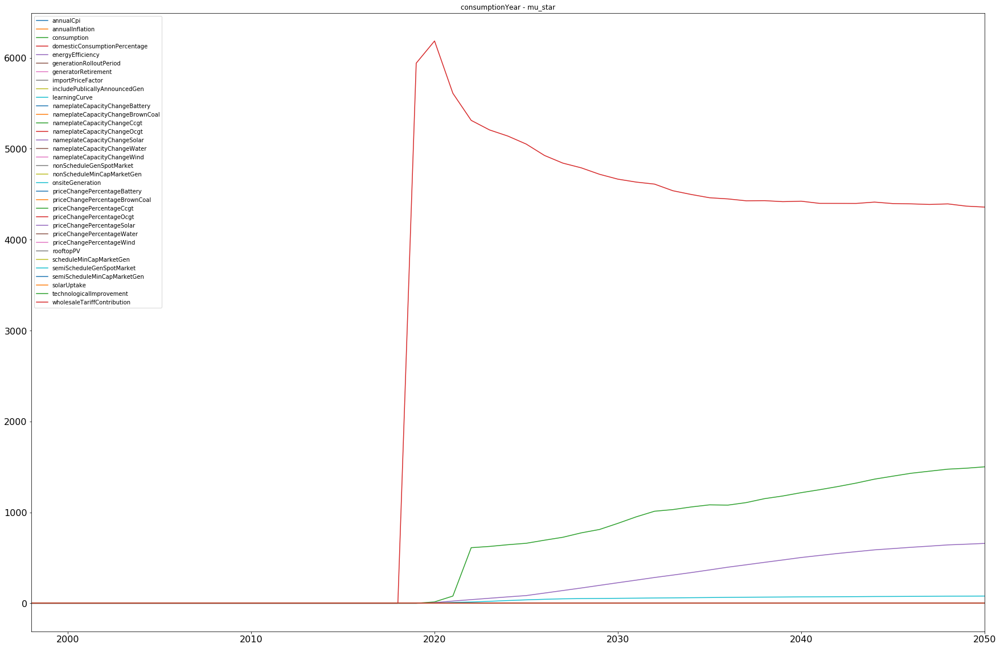

In [29]:
from SALib.analyze import morris

sigma_years_ooi = {}
mu_star_years_ooi = {}
for ooi in outcomes_to_show:
    mu_star_years = pd.DataFrame([],columns=uncertainties)
    sigma_years = pd.DataFrame([],columns=uncertainties)
    for t in range(startYearShift, startYearShift + len(time)):
        dataY = outcomes[ooi][:, t]
        #change num_levels = p to do the analysis with p levels
        Si = morris.analyze(problem, X, dataY, num_levels=6)
        
        morris_stats = {key: Si[key] for key in ['mu', 'mu_star', 'sigma',
                                                           'mu_star_conf']}
        morris_stats = pd.DataFrame(morris_stats, index=uncertainties)
        
        mu_star = pd.DataFrame([morris_stats['mu_star']],columns=uncertainties)                    
        mu_star_years = mu_star_years.append(mu_star)
        
        sigma = pd.DataFrame([Si['sigma']], columns=uncertainties)
        sigma_years = sigma_years.append(sigma)
    
    mu_star_years = mu_star_years.set_index(time)
    sigma_years = sigma_years.set_index(time)
    
    #Filter columns for which all values are zero
    mu_star_years = mu_star_years[mu_star_years.columns[(mu_star_years != 0).any()]]
    sigma_years = sigma_years[sigma_years.columns[(sigma_years != 0).any()]]

    mu_star_years_ooi[ooi] = mu_star_years
    sigma_years_ooi[ooi] = sigma_years
    print(ooi)
    if includePlots:
        # Figure showing timeseries of mu* and sigma for each output and lever/uncertainty
        plt_mu_star_years = mu_star_years.plot.line(title=ooi+' - mu_star', figsize=(30, 20), fontsize=20)
        plt_mu_star_years.set_title(f"{ooi} - mu_star", fontsize=25)
        plt.legend(fontsize=20)
        
        plt_sigma_years = sigma_years.plot.line(title=ooi + ' - sigma', figsize=(30, 20), fontsize=20)
        plt_sigma_years.set_title(f"{ooi} - sigma", fontsize=25)
        plt.legend(fontsize=20)

        plt_mu_star_years.get_figure().savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_mu_star_years_%s'%(ooi)), 
                         dpi=300, bbox_inches='tight')
        plt_sigma_years.get_figure().savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_sigma_years_%s'%(ooi)), 
                         dpi=300, bbox_inches='tight')    


In [28]:
import matplotlib.ticker as ticker


for ooi in outcomes_to_show:
    mu_star_years = mu_star_years_ooi[ooi]
    for t in range(startYearShift, startYearShift + len(time)):            
        mu_star = pd.DataFrame([mu_star_years.iloc[t]],columns=uncertainties).T  
        mu_star.columns = ['mu_star']
        mu_star = mu_star.sort_values(by='mu_star', ascending=False)
        # mu_star['num_index'] = np.arange(len(problem['names']))
        year = mu_star_years.index[t]
        print(ooi + ' - year ' + str(year))
        print(mu_star[:5])
        
        

        # f = plt.figure(figsize=(30,20))    
        # chart = sns.barplot(
        #     data=mu_star,
        #     x=mu_star.index,
        #     y='mu_star'
        # 
        # )
        # xlabels = chart.get_xticklabels()        
        # chart.set_xticklabels(xlabels, rotation=90)
        # f.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\figs', '_mu_star_year_%d_%s'%(year,ooi)), 
        #                     dpi=300, bbox_inches='tight')
        # 
        # f.clear()
        # plt.close(f)

consumptionYear - year 1998
                                    mu_star
domesticConsumptionPercentage   8487.058238
annualCpi                          0.000000
priceChangePercentageWind          0.000000
priceChangePercentageBattery       0.000000
priceChangePercentageBrownCoal     0.000000
consumptionYear - year 1999
                                    mu_star
domesticConsumptionPercentage   9301.553382
annualCpi                          0.000000
priceChangePercentageWind          0.000000
priceChangePercentageBattery       0.000000
priceChangePercentageBrownCoal     0.000000
consumptionYear - year 2000
                                    mu_star
domesticConsumptionPercentage   9725.638404
annualCpi                          0.000000
priceChangePercentageWind          0.000000
priceChangePercentageBattery       0.000000
priceChangePercentageBrownCoal     0.000000
consumptionYear - year 2001
                                    mu_star
domesticConsumptionPercentage   9596.639643
annualCp

consumptionYear - year 2047
                                   mu_star
domesticConsumptionPercentage  4386.488883
consumption                    1452.784184
energyEfficiency                628.481347
onsiteGeneration                 76.864002
annualCpi                         0.000000
consumptionYear - year 2048
                                   mu_star
domesticConsumptionPercentage  4392.714556
consumption                    1474.969096
energyEfficiency                642.029678
onsiteGeneration                 78.217878
annualCpi                         0.000000
consumptionYear - year 2049
                                   mu_star
domesticConsumptionPercentage  4368.147512
consumption                    1485.469633
energyEfficiency                649.740670
onsiteGeneration                 78.672457
annualCpi                         0.000000
consumptionYear - year 2050
                                   mu_star
domesticConsumptionPercentage  4357.633135
consumption                 

tariffsYear - year 2050
                                    mu_star
nameplateCapacityChangeBrownCoal  69.153620
wholesaleTariffContribution       66.754001
includePublicallyAnnouncedGen     65.486348
annualCpi                         62.815196
generatorRetirement               61.091497
wholesalePriceYear - year 1998
                                mu_star
annualCpi                           0.0
priceChangePercentageWater          0.0
onsiteGeneration                    0.0
priceChangePercentageBattery        0.0
priceChangePercentageBrownCoal      0.0
wholesalePriceYear - year 1999
                                    mu_star
nameplateCapacityChangeBrownCoal  23.133145
priceChangePercentageOcgt         11.336116
importPriceFactor                 10.349399
priceChangePercentageBrownCoal     4.294080
priceChangePercentageWater         1.707788
wholesalePriceYear - year 2000
                                    mu_star
nameplateCapacityChangeBrownCoal  21.502719
priceChangePercentageOcgt  

wholesalePriceYear - year 2050
                                     mu_star
nameplateCapacityChangeBrownCoal  214.975306
annualInflation                   214.638847
importPriceFactor                 182.405980
includePublicallyAnnouncedGen     172.953557
generatorRetirement               159.202327
GHGYear - year 1998
                                       mu_star
domesticConsumptionPercentage     1.078144e+01
nameplateCapacityChangeWater      4.839700e-07
nameplateCapacityChangeBrownCoal  4.493330e-07
nameplateCapacityChangeOcgt       7.142423e-08
annualCpi                         0.000000e+00
GHGYear - year 1999
                                    mu_star
domesticConsumptionPercentage     11.207201
nameplateCapacityChangeBrownCoal   2.645427
nameplateCapacityChangeWater       0.755261
priceChangePercentageWater         0.543521
priceChangePercentageBrownCoal     0.395946
GHGYear - year 2000
                                    mu_star
domesticConsumptionPercentage     11.600311
namep

primarySpotProductionYear - year 2000
                                       mu_star
nameplateCapacityChangeBrownCoal  1.365938e+07
nameplateCapacityChangeWater      1.948331e+06
nameplateCapacityChangeOcgt       7.320965e+05
nonScheduleGenSpotMarket          4.640594e+05
nonScheduleMinCapMarketGen        1.393434e+05
primarySpotProductionYear - year 2001
                                       mu_star
nameplateCapacityChangeBrownCoal  1.322081e+07
nameplateCapacityChangeWater      1.976981e+06
nameplateCapacityChangeOcgt       8.004956e+05
nonScheduleGenSpotMarket          6.350507e+05
nonScheduleMinCapMarketGen        1.931970e+05
primarySpotProductionYear - year 2002
                                       mu_star
nameplateCapacityChangeBrownCoal  1.288495e+07
nameplateCapacityChangeWater      2.044796e+06
nameplateCapacityChangeOcgt       1.018221e+06
nonScheduleGenSpotMarket          8.238049e+05
nonScheduleMinCapMarketGen        2.417308e+05
primarySpotProductionYear - year 2003
  

secondarySpotProductionYear - year 2002
                                   mu_star
nonScheduleGenSpotMarket      358635.93124
nonScheduleMinCapMarketGen     80369.33252
nameplateCapacityChangeWater   54410.41860
nameplateCapacityChangeOcgt    25607.23200
nameplateCapacityChangeWind    25064.93220
secondarySpotProductionYear - year 2003
                                  mu_star
nonScheduleGenSpotMarket      385226.6680
semiScheduleGenSpotMarket     148099.2975
nonScheduleMinCapMarketGen     86361.6760
nameplateCapacityChangeWind    85603.6398
nameplateCapacityChangeWater   54410.4186
secondarySpotProductionYear - year 2004
                                    mu_star
nonScheduleGenSpotMarket      393395.455248
semiScheduleGenSpotMarket     148505.049000
nonScheduleMinCapMarketGen     94389.119024
nameplateCapacityChangeWind    85838.170320
nameplateCapacityChangeWater   54559.488240
secondarySpotProductionYear - year 2005
                                   mu_star
nonScheduleGenSpotMarke

offSpotProductionYear - year 2006
                                    mu_star
nonScheduleGenSpotMarket      577820.004141
nonScheduleMinCapMarketGen    430928.339332
semiScheduleGenSpotMarket     170511.757500
scheduleMinCapMarketGen       166928.370000
nameplateCapacityChangeWater  151999.534200
offSpotProductionYear - year 2007
                                   mu_star
nonScheduleGenSpotMarket     605125.832421
nonScheduleMinCapMarketGen   499866.487028
semiScheduleGenSpotMarket    257436.811741
nameplateCapacityChangeWind  174085.936412
scheduleMinCapMarketGen      166953.327285
offSpotProductionYear - year 2008
                                   mu_star
nonScheduleGenSpotMarket     621286.459627
nonScheduleMinCapMarketGen   537709.314701
semiScheduleGenSpotMarket    258160.921223
nameplateCapacityChangeWind  174550.894711
scheduleMinCapMarketGen      167429.487334
offSpotProductionYear - year 2009
                                   mu_star
semiScheduleGenSpotMarket    724597.70531

renewableContributionYear - year 2008
                                   mu_star
nameplateCapacityChangeBrownCoal  0.278337
nameplateCapacityChangeWater      0.114540
priceChangePercentageWater        0.039754
priceChangePercentageBrownCoal    0.025230
nameplateCapacityChangeOcgt       0.011212
renewableContributionYear - year 2009
                                   mu_star
nameplateCapacityChangeBrownCoal  0.282765
nameplateCapacityChangeWater      0.112199
priceChangePercentageWater        0.041651
priceChangePercentageBrownCoal    0.026478
nameplateCapacityChangeWind       0.011280
renewableContributionYear - year 2010
                                   mu_star
nameplateCapacityChangeBrownCoal  0.290212
nameplateCapacityChangeWater      0.117179
priceChangePercentageWater        0.044659
priceChangePercentageBrownCoal    0.028455
nameplateCapacityChangeOcgt       0.014116
renewableContributionYear - year 2011
                                   mu_star
nameplateCapacityChangeBrownCoa

rooftopPVProductionYear - year 2010
                                     mu_star
nonScheduleMinCapMarketGen      40993.768928
nonScheduleGenSpotMarket        17753.535139
technologicalImprovement        13694.212292
onsiteGeneration                 1709.714592
nameplateCapacityChangeBattery   1613.104263
rooftopPVProductionYear - year 2011
                                  mu_star
nonScheduleMinCapMarketGen  119251.459384
nonScheduleGenSpotMarket    104356.287993
technologicalImprovement     36092.464398
priceChangePercentageWind     2232.686276
annualInflation               2229.351022
rooftopPVProductionYear - year 2012
                                     mu_star
nonScheduleGenSpotMarket       282553.669320
nonScheduleMinCapMarketGen     173640.765684
technologicalImprovement        62388.140563
nameplateCapacityChangeOcgt      2717.962904
domesticConsumptionPercentage    2532.551510
rooftopPVProductionYear - year 2013
                                     mu_star
nonScheduleGenSpotM

nonScheduleGenSpotMarket          3.818159e+05
coalProductionYear - year 2009
                                       mu_star
nameplateCapacityChangeBrownCoal  3.135720e+07
priceChangePercentageWater        1.255440e+06
priceChangePercentageBrownCoal    8.827107e+05
nameplateCapacityChangeWater      5.092499e+05
semiScheduleGenSpotMarket         4.101519e+05
coalProductionYear - year 2010
                                       mu_star
nameplateCapacityChangeBrownCoal  3.200119e+07
priceChangePercentageWater        1.367987e+06
priceChangePercentageBrownCoal    9.791212e+05
nameplateCapacityChangeWater      5.533888e+05
semiScheduleGenSpotMarket         4.819693e+05
coalProductionYear - year 2011
                                       mu_star
nameplateCapacityChangeBrownCoal  3.084497e+07
priceChangePercentageWater        1.469953e+06
priceChangePercentageBrownCoal    1.098178e+06
semiScheduleGenSpotMarket         6.406662e+05
nameplateCapacityChangeWater      5.931837e+05
coalProduction

waterProductionYear - year 2010
                                       mu_star
nameplateCapacityChangeBrownCoal  6.514411e+06
nameplateCapacityChangeWater      4.006285e+06
priceChangePercentageWater        1.489761e+06
priceChangePercentageBrownCoal    8.942494e+05
priceChangePercentageOcgt         1.124120e+05
waterProductionYear - year 2011
                                       mu_star
nameplateCapacityChangeBrownCoal  6.645596e+06
nameplateCapacityChangeWater      3.874089e+06
priceChangePercentageWater        1.601018e+06
priceChangePercentageBrownCoal    9.658521e+05
priceChangePercentageOcgt         1.173465e+05
waterProductionYear - year 2012
                                       mu_star
nameplateCapacityChangeBrownCoal  6.861848e+06
nameplateCapacityChangeWater      3.686306e+06
priceChangePercentageWater        1.800061e+06
priceChangePercentageBrownCoal    1.105453e+06
semiScheduleGenSpotMarket         1.337912e+05
waterProductionYear - year 2013
                          

windProductionYear - year 2012
                                       mu_star
nameplateCapacityChangeWind       1.424193e+06
semiScheduleGenSpotMarket         1.017633e+06
nameplateCapacityChangeBrownCoal  7.720938e+05
technologicalImprovement          4.588120e+05
learningCurve                     3.122397e+05
windProductionYear - year 2013
                                       mu_star
nameplateCapacityChangeWind       2.610032e+06
semiScheduleGenSpotMarket         1.941767e+06
nameplateCapacityChangeBrownCoal  1.285830e+06
technologicalImprovement          8.314860e+05
learningCurve                     7.535654e+05
windProductionYear - year 2014
                                       mu_star
nameplateCapacityChangeWind       2.892371e+06
semiScheduleGenSpotMarket         2.090922e+06
nameplateCapacityChangeBrownCoal  1.409415e+06
technologicalImprovement          9.162552e+05
learningCurve                     8.368010e+05
windProductionYear - year 2015
                              

gasProductionYear - year 2016
                                       mu_star
nameplateCapacityChangeBrownCoal  6.597473e+06
nameplateCapacityChangeOcgt       1.805845e+06
nameplateCapacityChangeWater      7.090809e+05
nameplateCapacityChangeWind       5.456658e+05
nonScheduleGenSpotMarket          2.277183e+05
gasProductionYear - year 2017
                                       mu_star
nameplateCapacityChangeBrownCoal  6.239143e+06
nameplateCapacityChangeOcgt       2.013517e+06
nameplateCapacityChangeWater      8.856585e+05
nameplateCapacityChangeWind       7.705784e+05
technologicalImprovement          2.991671e+05
gasProductionYear - year 2018
                                       mu_star
nameplateCapacityChangeBrownCoal  6.004705e+06
nameplateCapacityChangeOcgt       1.945182e+06
nameplateCapacityChangeWater      8.996870e+05
nameplateCapacityChangeWind       8.429339e+05
technologicalImprovement          3.378539e+05
gasProductionYear - year 2019
                                  

solarProductionYear - year 2021
                                     mu_star
nameplateCapacityChangeSolar   312533.936181
semiScheduleGenSpotMarket      172752.308095
nonScheduleMinCapMarketGen      95720.762763
includePublicallyAnnouncedGen   85752.309942
nonScheduleGenSpotMarket        75431.495923
solarProductionYear - year 2022
                                     mu_star
nameplateCapacityChangeSolar   336734.164524
semiScheduleGenSpotMarket      206694.473147
includePublicallyAnnouncedGen  160393.526555
nonScheduleMinCapMarketGen      96295.439545
nonScheduleGenSpotMarket        75773.832280
solarProductionYear - year 2023
                                     mu_star
nameplateCapacityChangeSolar   361991.227994
semiScheduleGenSpotMarket      240636.638199
includePublicallyAnnouncedGen  235034.743168
generationRolloutPeriod        107109.148590
nonScheduleMinCapMarketGen      96870.116327
solarProductionYear - year 2024
                                     mu_star
nameplateCapacity

BatteryProductionYear - year 2005
                                mu_star
annualCpi                           0.0
priceChangePercentageWater          0.0
onsiteGeneration                    0.0
priceChangePercentageBattery        0.0
priceChangePercentageBrownCoal      0.0
BatteryProductionYear - year 2006
                                mu_star
annualCpi                           0.0
priceChangePercentageWater          0.0
onsiteGeneration                    0.0
priceChangePercentageBattery        0.0
priceChangePercentageBrownCoal      0.0
BatteryProductionYear - year 2007
                                mu_star
annualCpi                           0.0
priceChangePercentageWater          0.0
onsiteGeneration                    0.0
priceChangePercentageBattery        0.0
priceChangePercentageBrownCoal      0.0
BatteryProductionYear - year 2008
                                mu_star
annualCpi                           0.0
priceChangePercentageWater          0.0
onsiteGeneration        

technologicalImprovement          1.326115e+05
primaryUnmetDemandMwh - year 2010
                                       mu_star
nameplateCapacityChangeBrownCoal  1.825106e+07
nameplateCapacityChangeWater      2.817341e+06
nameplateCapacityChangeOcgt       2.141434e+06
nameplateCapacityChangeWind       4.852091e+05
technologicalImprovement          1.552707e+05
primaryUnmetDemandMwh - year 2011
                                       mu_star
nameplateCapacityChangeBrownCoal  1.673546e+07
nameplateCapacityChangeWater      2.661261e+06
nameplateCapacityChangeOcgt       1.996204e+06
nameplateCapacityChangeWind       5.794752e+05
technologicalImprovement          2.047531e+05
primaryUnmetDemandMwh - year 2012
                                       mu_star
nameplateCapacityChangeBrownCoal  1.420953e+07
nameplateCapacityChangeWater      2.407768e+06
nameplateCapacityChangeOcgt       1.768879e+06
nameplateCapacityChangeWind       6.088651e+05
technologicalImprovement          2.385391e+05
prima

primaryUnmetDemandMwh - year 2044
                                       mu_star
nameplateCapacityChangeBrownCoal  1.335008e+07
generatorRetirement               1.109731e+07
nameplateCapacityChangeWind       1.011894e+07
consumption                       7.324815e+06
nameplateCapacityChangeWater      6.362731e+06
primaryUnmetDemandMwh - year 2045
                                       mu_star
nameplateCapacityChangeBrownCoal  1.441144e+07
generatorRetirement               1.194084e+07
nameplateCapacityChangeWind       9.124558e+06
consumption                       8.156458e+06
nameplateCapacityChangeWater      6.649177e+06
primaryUnmetDemandMwh - year 2046
                                       mu_star
nameplateCapacityChangeBrownCoal  1.587860e+07
generatorRetirement               1.546125e+07
consumption                       9.712372e+06
nameplateCapacityChangeWind       9.392119e+06
nameplateCapacityChangeWater      7.297002e+06
primaryUnmetDemandMwh - year 2047
                  

primaryUnmetDemandHours - year 2034
                                      mu_star
nameplateCapacityChangeBrownCoal  5142.816667
nameplateCapacityChangeWind       2664.425000
nameplateCapacityChangeWater      1459.341667
consumption                       1120.116667
nameplateCapacityChangeOcgt       1105.083333
primaryUnmetDemandHours - year 2035
                                      mu_star
nameplateCapacityChangeBrownCoal  5216.066667
nameplateCapacityChangeWind       2721.258333
nameplateCapacityChangeWater      1483.041667
consumption                       1172.325000
nameplateCapacityChangeOcgt       1136.575000
primaryUnmetDemandHours - year 2036
                                      mu_star
nameplateCapacityChangeBrownCoal  5329.066667
nameplateCapacityChangeWind       2790.508333
nameplateCapacityChangeWater      1519.533333
consumption                       1202.591667
nameplateCapacityChangeOcgt       1186.983333
primaryUnmetDemandHours - year 2037
                            

primaryUnmetDemandDays - year 2024
                                     mu_star
nameplateCapacityChangeBrownCoal  309.816667
nameplateCapacityChangeWind       109.825000
nameplateCapacityChangeWater       63.358333
generationRolloutPeriod            56.075000
nameplateCapacityChangeOcgt        54.766667
primaryUnmetDemandDays - year 2025
                                     mu_star
nameplateCapacityChangeBrownCoal  300.508333
nameplateCapacityChangeWind       117.916667
nameplateCapacityChangeWater       64.608333
generationRolloutPeriod            59.491667
nameplateCapacityChangeOcgt        55.725000
primaryUnmetDemandDays - year 2026
                                     mu_star
nameplateCapacityChangeBrownCoal  290.375000
nameplateCapacityChangeWind       123.291667
nameplateCapacityChangeWater       65.775000
generationRolloutPeriod            57.975000
nameplateCapacityChangeOcgt        55.991667
primaryUnmetDemandDays - year 2027
                                     mu_star
namep

technologicalImprovement           189.187584
primaryMaxUnmetDemandMwhPerHour - year 2016
                                      mu_star
nameplateCapacityChangeBrownCoal  5321.180778
nameplateCapacityChangeWater       800.918358
nameplateCapacityChangeOcgt        734.345021
nameplateCapacityChangeWind        536.744762
technologicalImprovement           203.026864
primaryMaxUnmetDemandMwhPerHour - year 2017
                                      mu_star
nameplateCapacityChangeBrownCoal  4623.479822
nameplateCapacityChangeWater       800.919640
nameplateCapacityChangeOcgt        734.469445
nameplateCapacityChangeWind        649.638545
technologicalImprovement           270.258957
primaryMaxUnmetDemandMwhPerHour - year 2018
                                      mu_star
nameplateCapacityChangeBrownCoal  3960.957248
nameplateCapacityChangeWater       800.901816
nameplateCapacityChangeOcgt        728.584344
nameplateCapacityChangeWind        676.044521
technologicalImprovement           228.0

secondaryUnmetDemandMwh - year 2008
                                    mu_star
semiScheduleGenSpotMarket      1.303388e+07
nonScheduleGenSpotMarket       1.049727e+07
domesticConsumptionPercentage  7.244672e+06
nameplateCapacityChangeWind    1.308012e+05
nonScheduleMinCapMarketGen     1.175419e+05
secondaryUnmetDemandMwh - year 2009
                                    mu_star
semiScheduleGenSpotMarket      1.288236e+07
nonScheduleGenSpotMarket       1.049335e+07
domesticConsumptionPercentage  7.254405e+06
nameplateCapacityChangeWind    2.749525e+05
nonScheduleMinCapMarketGen     1.202673e+05
secondaryUnmetDemandMwh - year 2010
                                    mu_star
semiScheduleGenSpotMarket      1.299576e+07
nonScheduleGenSpotMarket       1.062381e+07
domesticConsumptionPercentage  7.347510e+06
nameplateCapacityChangeWind    3.222640e+05
nonScheduleMinCapMarketGen     1.211246e+05
secondaryUnmetDemandMwh - year 2011
                                    mu_star
semiScheduleGenSpotM

secondaryUnmetDemandHours - year 1999
                              mu_star
semiScheduleGenSpotMarket      5183.0
nonScheduleGenSpotMarket       4453.0
priceChangePercentageWater        0.0
onsiteGeneration                  0.0
priceChangePercentageBattery      0.0
secondaryUnmetDemandHours - year 2000
                              mu_star
semiScheduleGenSpotMarket      5197.2
nonScheduleGenSpotMarket       4465.2
priceChangePercentageWater        0.0
onsiteGeneration                  0.0
priceChangePercentageBattery      0.0
secondaryUnmetDemandHours - year 2001
                              mu_star
semiScheduleGenSpotMarket      5183.0
nonScheduleGenSpotMarket       4453.0
priceChangePercentageWater        0.0
onsiteGeneration                  0.0
priceChangePercentageBattery      0.0
secondaryUnmetDemandHours - year 2002
                              mu_star
semiScheduleGenSpotMarket      5183.0
nonScheduleGenSpotMarket       4453.0
priceChangePercentageWater        0.0
onsiteGenera

secondaryUnmetDemandHours - year 2050
                                   mu_star
semiScheduleGenSpotMarket      4827.700000
nonScheduleGenSpotMarket       4356.416667
includePublicallyAnnouncedGen   603.066667
nameplateCapacityChangeWind     442.483333
generationRolloutPeriod         314.958333
secondaryUnmetDemandDays - year 1998
                                mu_star
annualCpi                           0.0
priceChangePercentageWater          0.0
onsiteGeneration                    0.0
priceChangePercentageBattery        0.0
priceChangePercentageBrownCoal      0.0
secondaryUnmetDemandDays - year 1999
                                 mu_star
semiScheduleGenSpotMarket     215.958333
nonScheduleGenSpotMarket      185.541667
priceChangePercentageWater      0.000000
onsiteGeneration                0.000000
priceChangePercentageBattery    0.000000
secondaryUnmetDemandDays - year 2000
                              mu_star
semiScheduleGenSpotMarket      216.55
nonScheduleGenSpotMarket       

secondaryMaxUnmetDemandMwhPerHour - year 1998
                                mu_star
annualCpi                           0.0
priceChangePercentageWater          0.0
onsiteGeneration                    0.0
priceChangePercentageBattery        0.0
priceChangePercentageBrownCoal      0.0
secondaryMaxUnmetDemandMwhPerHour - year 1999
                                   mu_star
semiScheduleGenSpotMarket      1847.479737
nonScheduleGenSpotMarket       1489.425045
domesticConsumptionPercentage  1018.620308
nameplateCapacityChangeWater      4.855366
nonScheduleMinCapMarketGen        4.449136
secondaryMaxUnmetDemandMwhPerHour - year 2000
                                   mu_star
semiScheduleGenSpotMarket      1889.464749
nonScheduleGenSpotMarket       1523.429927
domesticConsumptionPercentage  1041.756729
nameplateCapacityChangeWater      4.855366
nonScheduleMinCapMarketGen        4.449136
secondaryMaxUnmetDemandMwhPerHour - year 2001
                                   mu_star
semiScheduleGenSp

In [29]:

#Save mu_star into EXCEL
writer = pd.ExcelWriter('{}/EE_{}.xlsx'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\data', '_mu_star'), engine='xlsxwriter')
for ooi in outcomes_to_show:
    
    mu_star_years = mu_star_years_ooi[ooi]
    if ooi == 'secondaryMaxUnmetDemandMwhPerHour':
        ooi = 'secondMaxUnmetMwhPerHour'
    mu_star_years.to_excel(writer, sheet_name=ooi)
writer.save()

#Save sigma into EXCEL
writer = pd.ExcelWriter('{}/EE_{}.xlsx'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\data', '_sigma'), engine='xlsxwriter')
for ooi in outcomes_to_show:
    sigma_years = sigma_years_ooi[ooi]
    if ooi == 'secondaryMaxUnmetDemandMwhPerHour':
        ooi = 'secondMaxUnmetMwhPerHour'
    sigma_years.to_excel(writer, sheet_name=ooi)
writer.save()

### Average mu_star and sigma all years in data frame

In [30]:
mu_star_average_ooi = {}
mu_star_max_val_ooi = {}
mu_star_median_ooi = {}
sigma_average_ooi = {}
sigma_max_val_ooi = {}
sigma_median_ooi = {}

for ooi in outcomes_to_show:
    
    mu_star_average_ooi[ooi] = mu_star_years_ooi[ooi].mean()    
    mu_star_max_val_ooi[ooi] = mu_star_years_ooi[ooi].max()
    mu_star_median_ooi[ooi] = mu_star_years_ooi[ooi].median()
    sigma_average_ooi[ooi] = sigma_years_ooi[ooi].mean()
    sigma_max_val_ooi[ooi] = sigma_years_ooi[ooi].max()
    sigma_median_ooi[ooi] = sigma_years_ooi[ooi].median()

### Scatter plots of mu_star vs sigma using max values
Previous figures shown the changes of mu* and sigma over time for each lever/uncertainty and output. However, it is difficult to capture the most significant inputs, for this a mu* vs sigma plot (EET) is more
appropriate.  

consumptionYear
tariffsYear
wholesalePriceYear
GHGYear
primarySpotProductionYear
secondarySpotProductionYear
offSpotProductionYear
renewableContributionYear
rooftopPVProductionYear
coalProductionYear
waterProductionYear
windProductionYear
gasProductionYear
solarProductionYear
BatteryProductionYear
primaryUnmetDemandMwh
primaryUnmetDemandHours
primaryUnmetDemandDays
primaryMaxUnmetDemandMwhPerHour
secondaryUnmetDemandMwh


C:\Users\angel\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



secondaryUnmetDemandHours


C:\Users\angel\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



secondaryUnmetDemandDays


C:\Users\angel\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



secondaryMaxUnmetDemandMwhPerHour


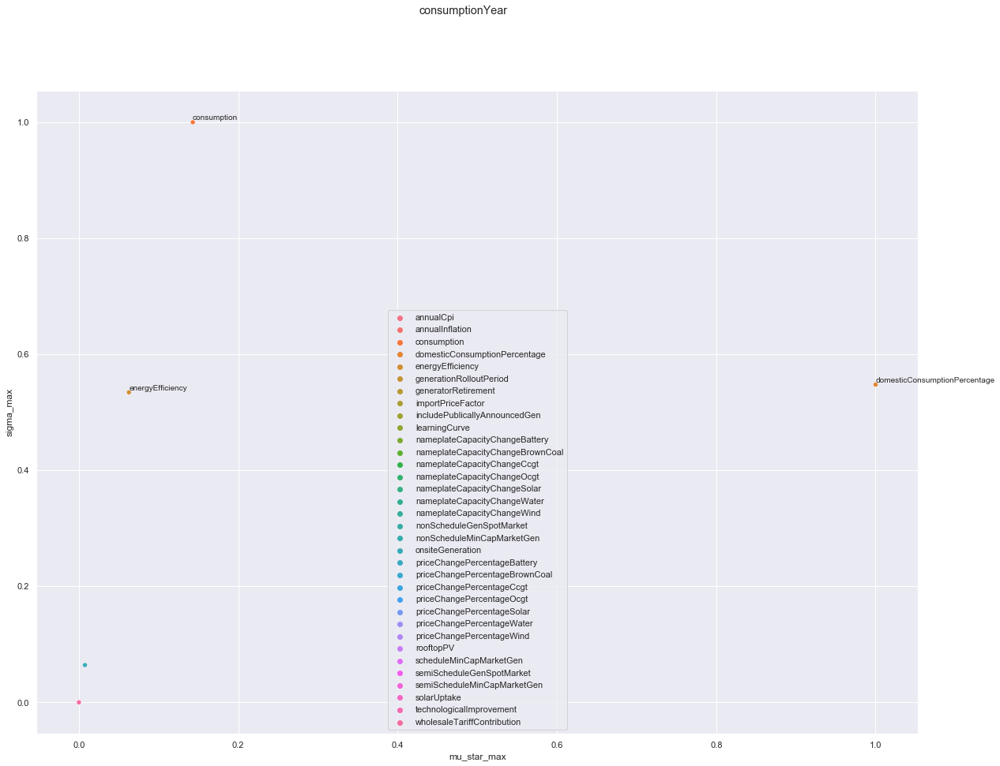

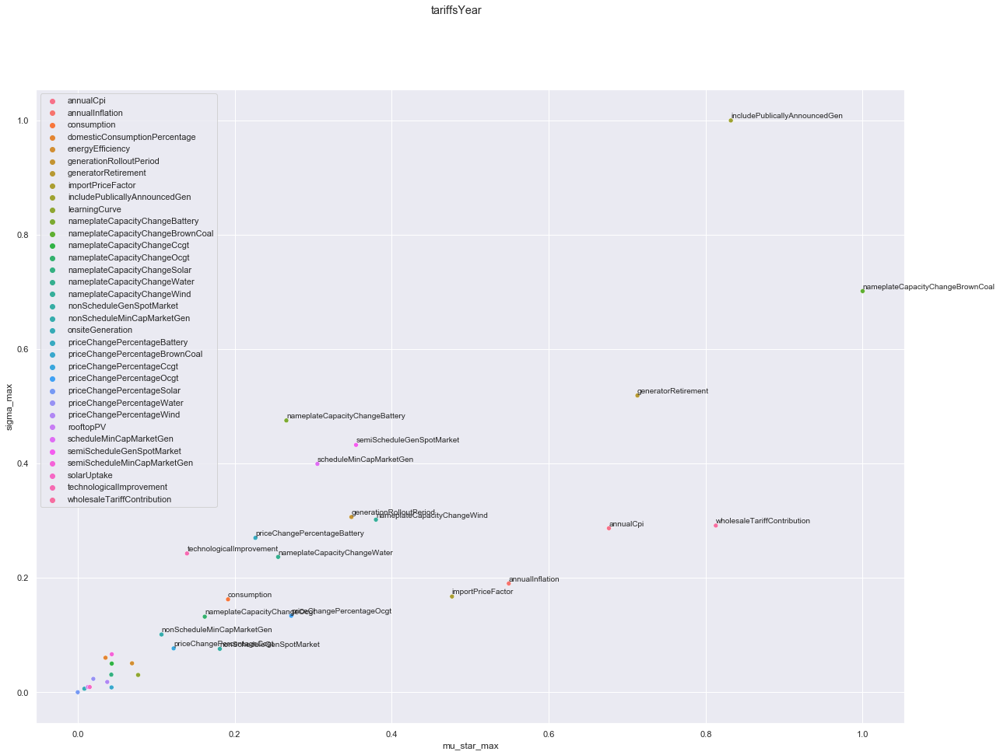

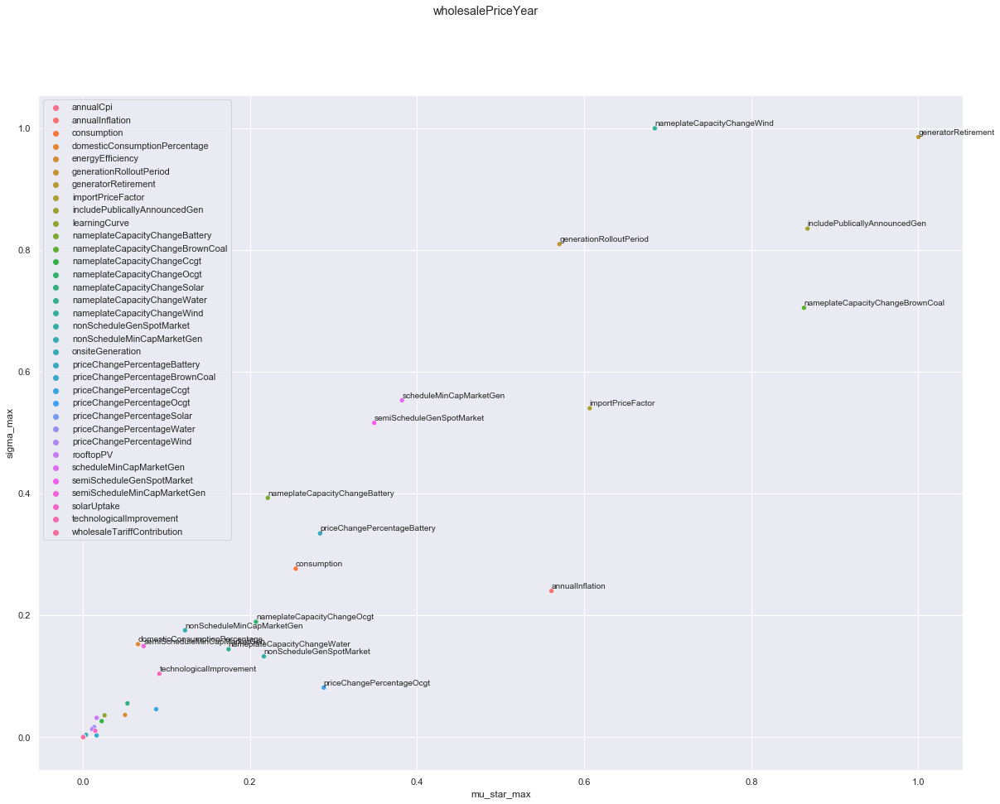

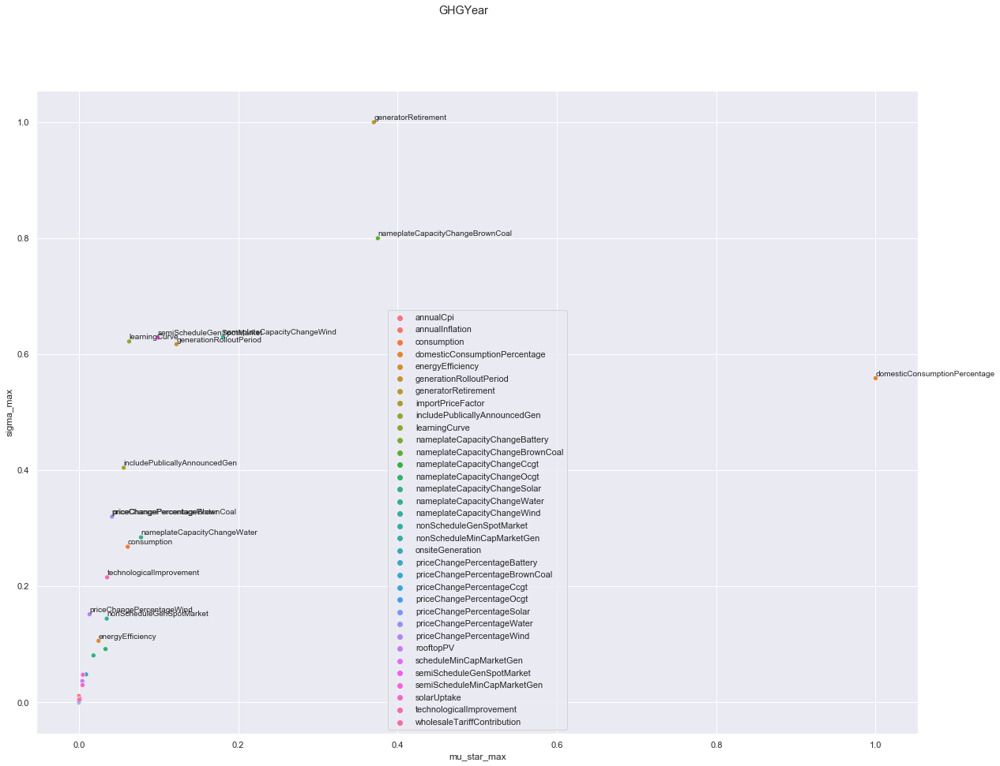

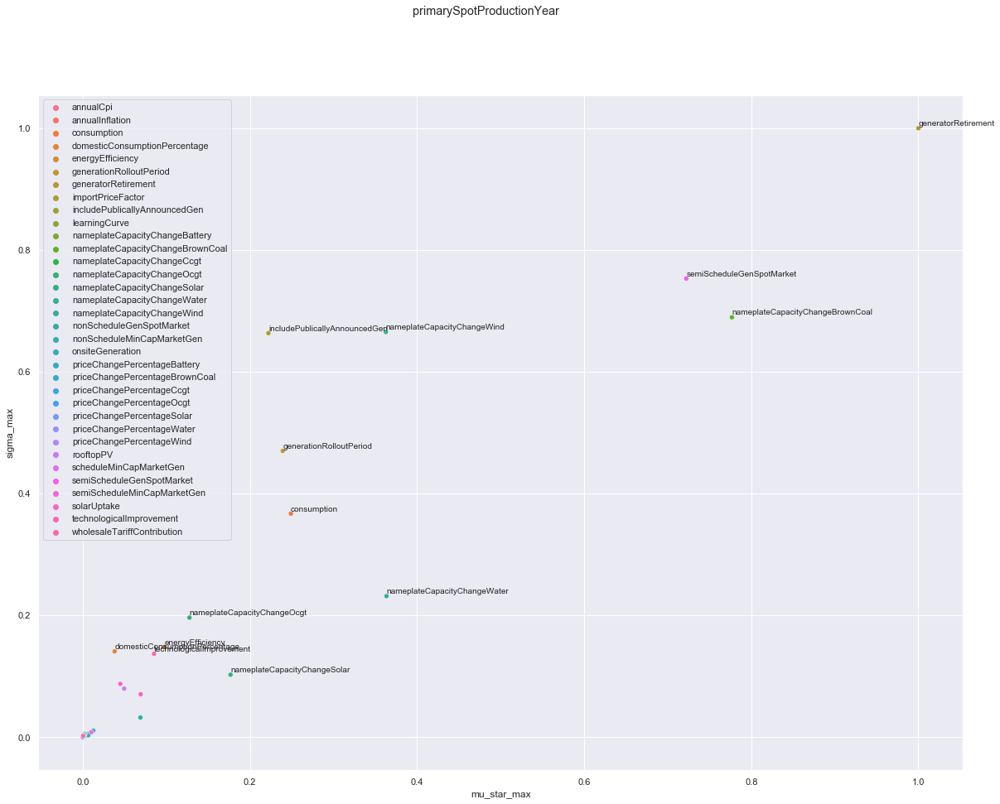

...

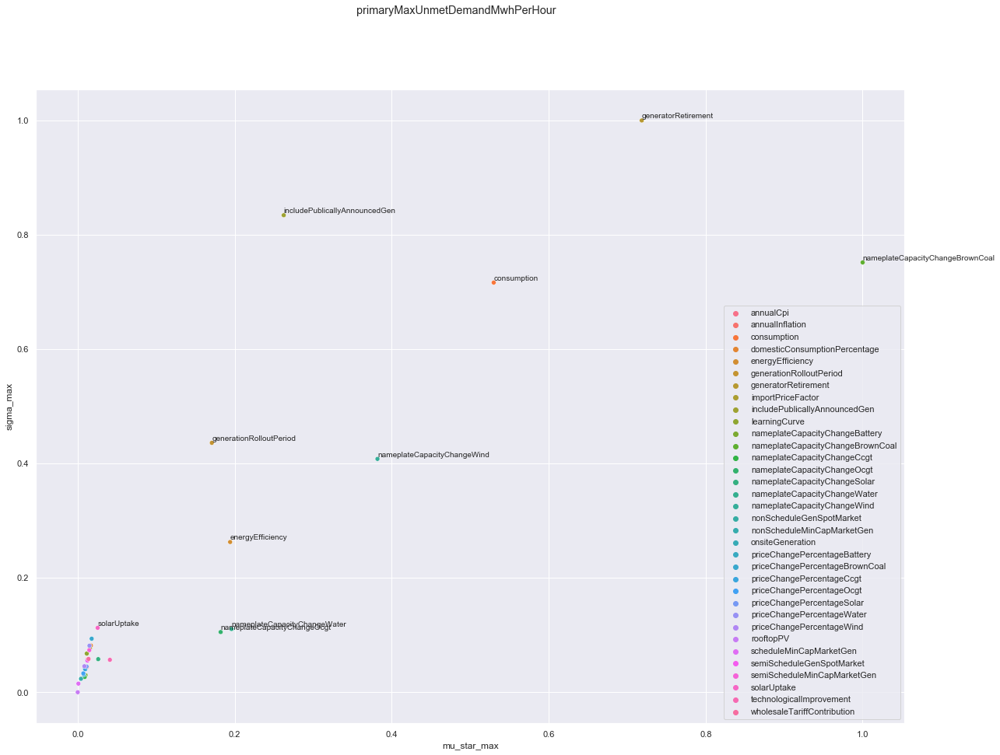

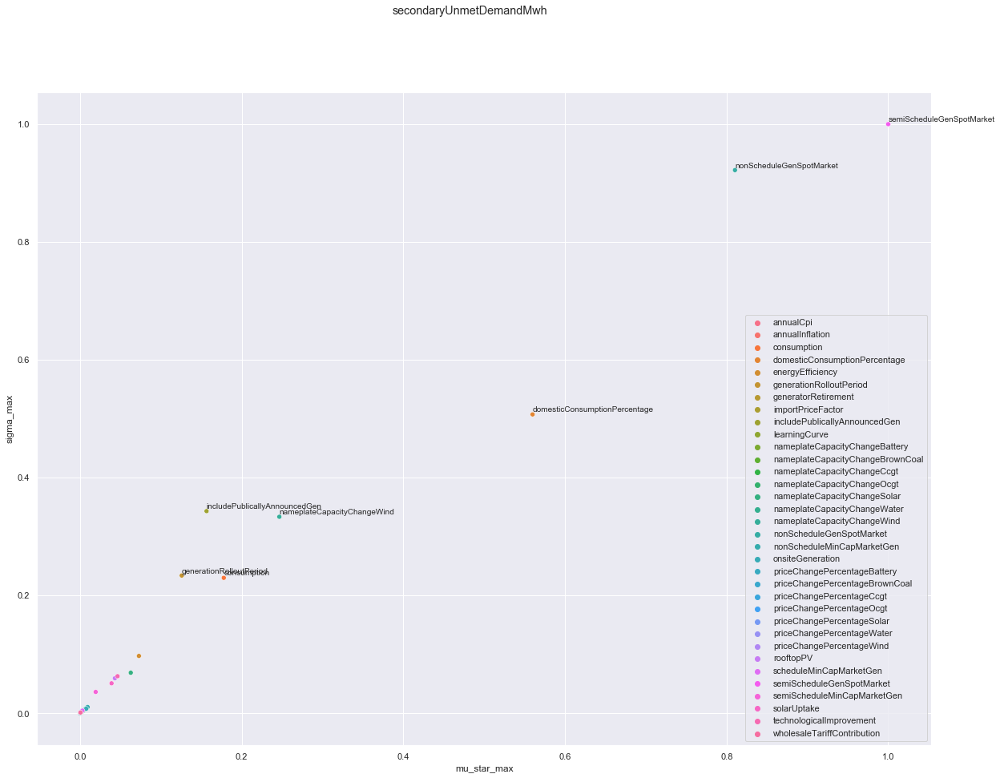

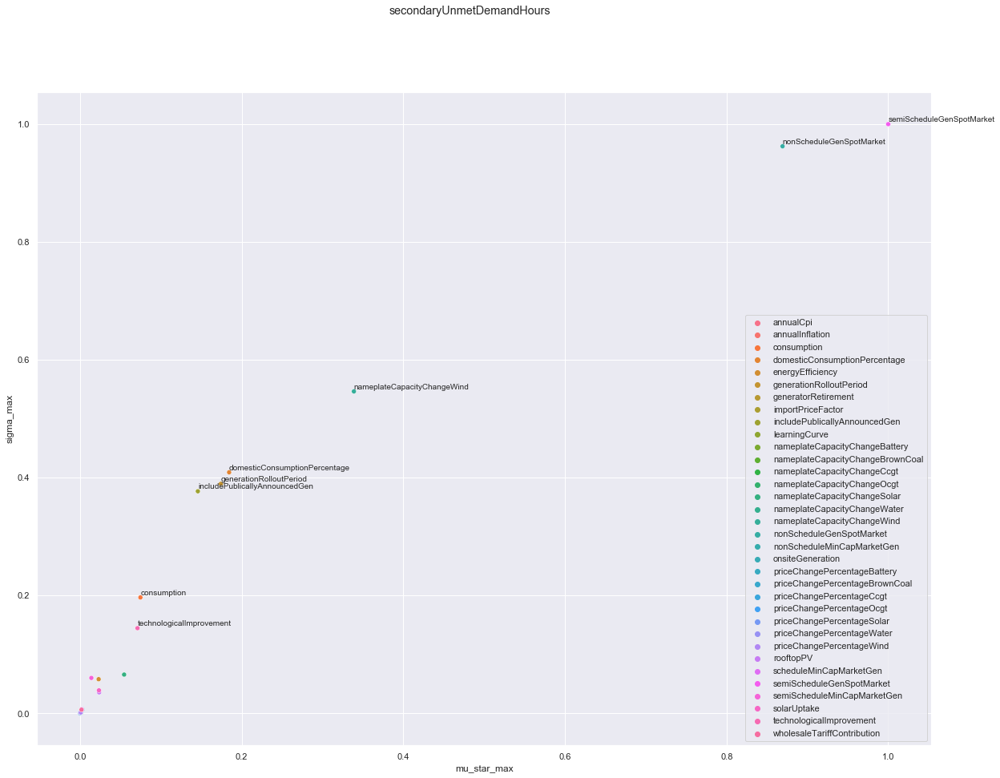

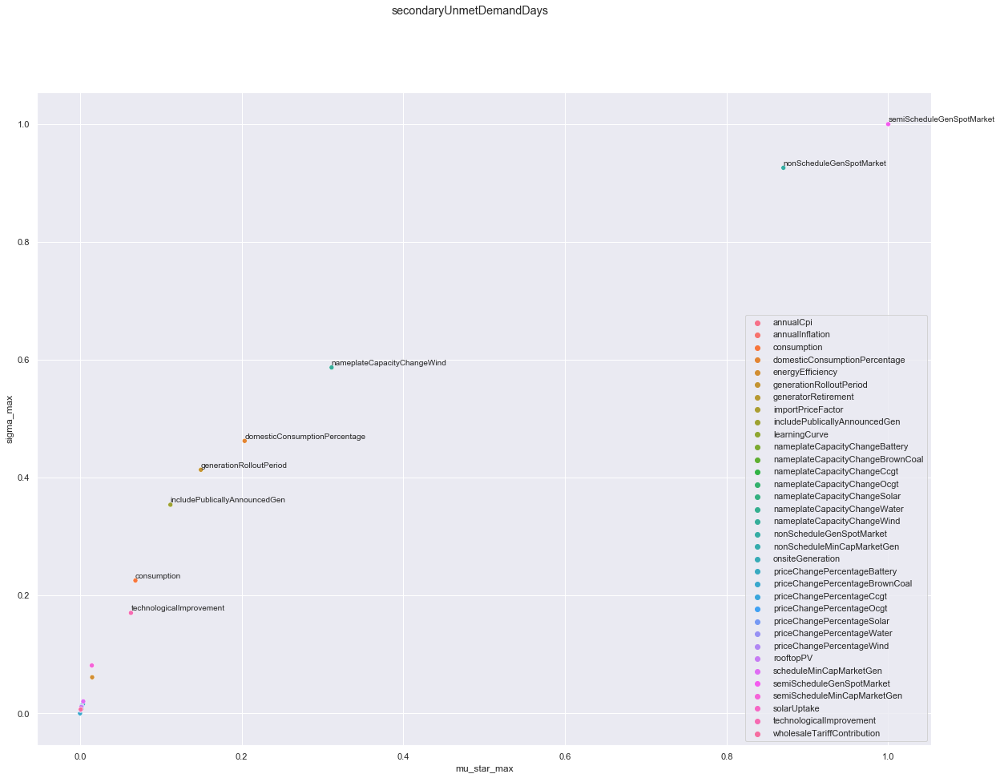

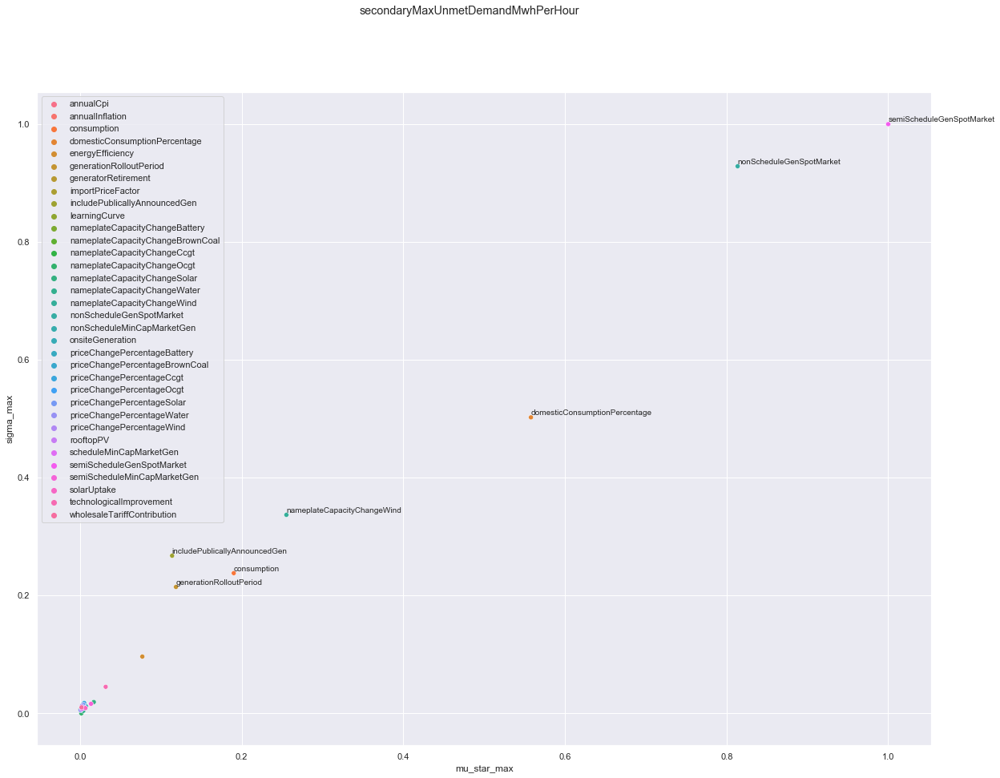

In [31]:
import seaborn as sns; sns.set()
#f = plt.figure(figsize=(20,30)) 
if includePlots:
    for ooi in outcomes_to_show:

        #Normalize values so all graphs are btw 0 and 1. Otherwise cannot use text coordinates below
        normalized_mu_star = (mu_star_max_val_ooi[ooi] - mu_star_max_val_ooi[ooi].min())/(mu_star_max_val_ooi[ooi].max() - mu_star_max_val_ooi[ooi].min())
        normalized_sigma = (sigma_max_val_ooi[ooi] - sigma_max_val_ooi[ooi].min())/(sigma_max_val_ooi[ooi].max() - sigma_max_val_ooi[ooi].min())

        df_max = pd.concat({'mu_star_max': normalized_mu_star,'sigma_max': normalized_sigma}, axis=1)

        f=plt.figure(figsize=(20,15))
        f.suptitle(ooi)


        sns.scatterplot(x='mu_star_max',y='sigma_max', hue=df_max.index, data=df_max)

        #df_max.plot.scatter(x='mu_star_max',y='sigma_max',c='DarkBlue')

        #Add labels above points
        for index, row in df_max.iterrows():
                if row['mu_star_max'] <= 0.1 and row['sigma_max'] <= 0.1: continue
                plt.annotate(index, # this is the text
                             (row['mu_star_max'],row['sigma_max']), # this is the point to label
                             textcoords="offset points", # how to position the text
                             xytext=(0,3), # distance from text to points (x,y)
                             ha='left', # horizontal alignment can be left, right or center
                             fontsize=10)  # font size



        print(ooi)

        plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', 'scatter_mu_star_sigmna_max_%s'%(ooi)),dpi=300, bbox_inches='tight')
    
# f.show()
# f.clear()
# plt.close(f)

### Subset significant factors - normalisation max values
Scatter plots of mu_star vs sigma 

consumptionYear - 3
['consumption' 'domesticConsumptionPercentage' 'energyEfficiency']
tariffsYear - 16
['annualCpi' 'annualInflation' 'generationRolloutPeriod'
 'generatorRetirement' 'importPriceFactor' 'includePublicallyAnnouncedGen'
 'nameplateCapacityChangeBattery' 'nameplateCapacityChangeBrownCoal'
 'nameplateCapacityChangeWater' 'nameplateCapacityChangeWind'
 'priceChangePercentageBattery' 'priceChangePercentageOcgt'
 'scheduleMinCapMarketGen' 'semiScheduleGenSpotMarket'
 'technologicalImprovement' 'wholesaleTariffContribution']
wholesalePriceYear - 15
['annualInflation' 'consumption' 'generationRolloutPeriod'
 'generatorRetirement' 'importPriceFactor' 'includePublicallyAnnouncedGen'
 'nameplateCapacityChangeBattery' 'nameplateCapacityChangeBrownCoal'
 'nameplateCapacityChangeOcgt' 'nameplateCapacityChangeWind'
 'nonScheduleGenSpotMarket' 'priceChangePercentageBattery'
 'priceChangePercentageOcgt' 'scheduleMinCapMarketGen'
 'semiScheduleGenSpotMarket']
GHGYear - 13
['consumption'

C:\Users\angel\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\angel\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\angel\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.m

secondaryMaxUnmetDemandMwhPerHour - 7
['consumption' 'domesticConsumptionPercentage' 'generationRolloutPeriod'
 'includePublicallyAnnouncedGen' 'nameplateCapacityChangeWind'
 'nonScheduleGenSpotMarket' 'semiScheduleGenSpotMarket']
ALL significant inputs (29)
{'nonScheduleGenSpotMarket', 'nameplateCapacityChangeBrownCoal', 'solarUptake', 'nameplateCapacityChangeWind', 'priceChangePercentageBattery', 'generatorRetirement', 'wholesaleTariffContribution', 'priceChangePercentageWater', 'scheduleMinCapMarketGen', 'consumption', 'nameplateCapacityChangeWater', 'technologicalImprovement', 'semiScheduleGenSpotMarket', 'annualCpi', 'generationRolloutPeriod', 'nameplateCapacityChangeOcgt', 'annualInflation', 'domesticConsumptionPercentage', 'learningCurve', 'nonScheduleMinCapMarketGen', 'semiScheduleMinCapMarketGen', 'importPriceFactor', 'nameplateCapacityChangeSolar', 'priceChangePercentageOcgt', 'priceChangePercentageBrownCoal', 'includePublicallyAnnouncedGen', 'energyEfficiency', 'rooftopPV', 

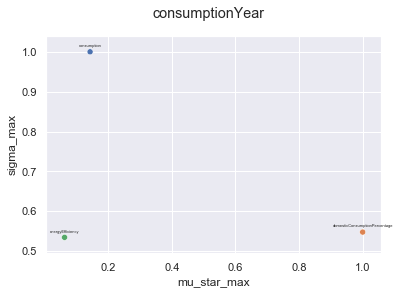

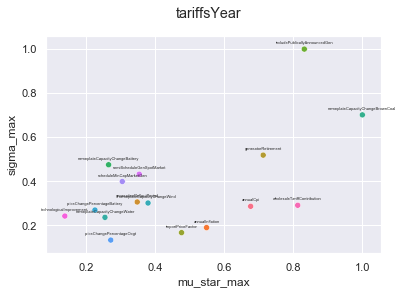

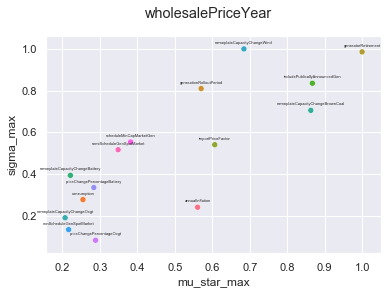

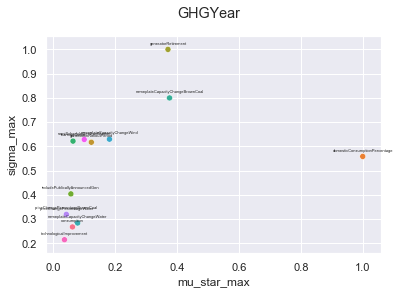

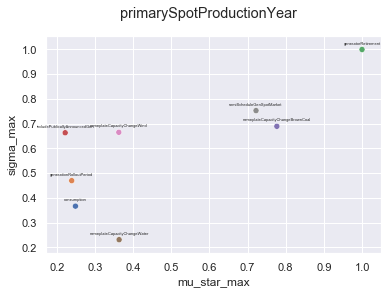

...

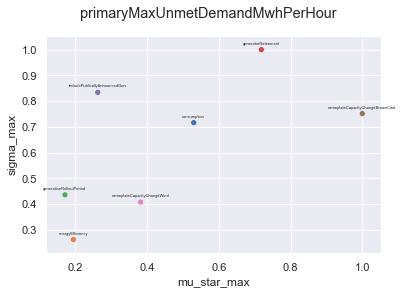

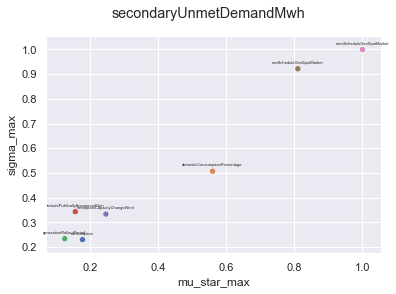

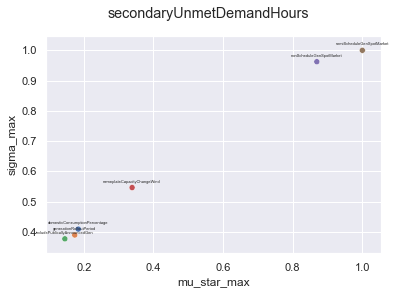

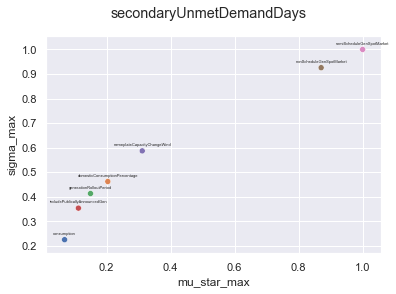

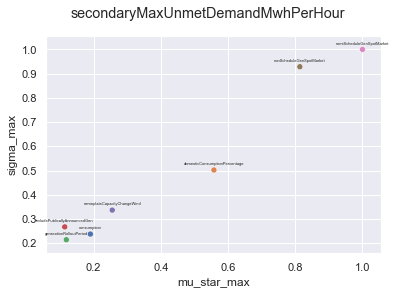

In [32]:
import seaborn as sns; sns.set()
#f = plt.figure(figsize=(20,30)) 

#bound used to filter INPUTS
significance_bound = 0.20
significant_inputs_max = set()
significant_inputs_filter_max = {}
for ooi in outcomes_to_show:
    #Normalize values so all graphs are btw 0 and 1. Otherwise cannot use text coordinates below
    normalized_mu_star = (mu_star_max_val_ooi[ooi] - mu_star_max_val_ooi[ooi].min())/(mu_star_max_val_ooi[ooi].max() - mu_star_max_val_ooi[ooi].min())
    normalized_sigma = (sigma_max_val_ooi[ooi] - sigma_max_val_ooi[ooi].min())/(sigma_max_val_ooi[ooi].max() - sigma_max_val_ooi[ooi].min())
    
    #filter values
    filter_mu_star = normalized_mu_star > significance_bound
    filter_sigma = normalized_sigma > significance_bound
    normalized_mu_star_filtered = normalized_mu_star[ filter_mu_star | filter_sigma ]
    normalized_sigma_filtered = normalized_sigma[ filter_mu_star | filter_sigma ] 
    
    #keep track significant inputs filter
    significant_inputs_filter_max[ooi] = normalized_mu_star_filtered.index.values
    for l in normalized_mu_star_filtered.index.values:
        significant_inputs_max.add(l) 
    
    #create dataframe     
    df_max = pd.concat({'mu_star_max': normalized_mu_star_filtered,'sigma_max': normalized_sigma_filtered}, axis=1)
    
    #print significant indexes per ooi
    print(ooi + ' - {}'.format(len(significant_inputs_filter_max[ooi])))
    print(significant_inputs_filter_max[ooi])
    
    if includePlots:
        #create figure
        f=plt.figure()#figsize=(30,20))
        f.suptitle(ooi)

        #ScatterPlot        
        sns.scatterplot(x='mu_star_max',y='sigma_max', hue=df_max.index, data=df_max, legend=False)


        #Add labels above points
        for index, row in df_max.iterrows():
                plt.annotate(index, # this is the text
                             (row['mu_star_max'],row['sigma_max']), # this is the point to label
                             textcoords="offset points", # how to position the text
                             xytext=(0,5), # distance from text to points (x,y)
                             ha='center', # horizontal alignment can be left, right or center
                             fontsize=4)  # font size

        

#     plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', 'scatter_mu_star_sigmna_max_%s_filtered'%(ooi)),dpi=300, bbox_inches='tight')


print("ALL significant inputs (%d)"%len(significant_inputs_max))
print(significant_inputs_max)

In [33]:
normalized_mu_star.index

Index(['annualCpi', 'annualInflation', 'consumption',
       'domesticConsumptionPercentage', 'energyEfficiency',
       'generationRolloutPeriod', 'generatorRetirement', 'importPriceFactor',
       'includePublicallyAnnouncedGen', 'learningCurve',
       'nameplateCapacityChangeBattery', 'nameplateCapacityChangeBrownCoal',
       'nameplateCapacityChangeCcgt', 'nameplateCapacityChangeOcgt',
       'nameplateCapacityChangeSolar', 'nameplateCapacityChangeWater',
       'nameplateCapacityChangeWind', 'nonScheduleGenSpotMarket',
       'nonScheduleMinCapMarketGen', 'onsiteGeneration',
       'priceChangePercentageBattery', 'priceChangePercentageBrownCoal',
       'priceChangePercentageCcgt', 'priceChangePercentageOcgt',
       'priceChangePercentageSolar', 'priceChangePercentageWater',
       'priceChangePercentageWind', 'rooftopPV', 'scheduleMinCapMarketGen',
       'semiScheduleGenSpotMarket', 'semiScheduleMinCapMarketGen',
       'solarUptake', 'technologicalImprovement',
       'whole

### Scatter plots of mu_star vs sigma using mean values

consumptionYear
tariffsYear
wholesalePriceYear
GHGYear
primarySpotProductionYear
secondarySpotProductionYear
offSpotProductionYear
renewableContributionYear
rooftopPVProductionYear
coalProductionYear
waterProductionYear
windProductionYear
gasProductionYear
solarProductionYear
BatteryProductionYear
primaryUnmetDemandMwh
primaryUnmetDemandHours
primaryUnmetDemandDays
primaryMaxUnmetDemandMwhPerHour
secondaryUnmetDemandMwh


C:\Users\angel\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



secondaryUnmetDemandHours


C:\Users\angel\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



secondaryUnmetDemandDays


C:\Users\angel\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



secondaryMaxUnmetDemandMwhPerHour


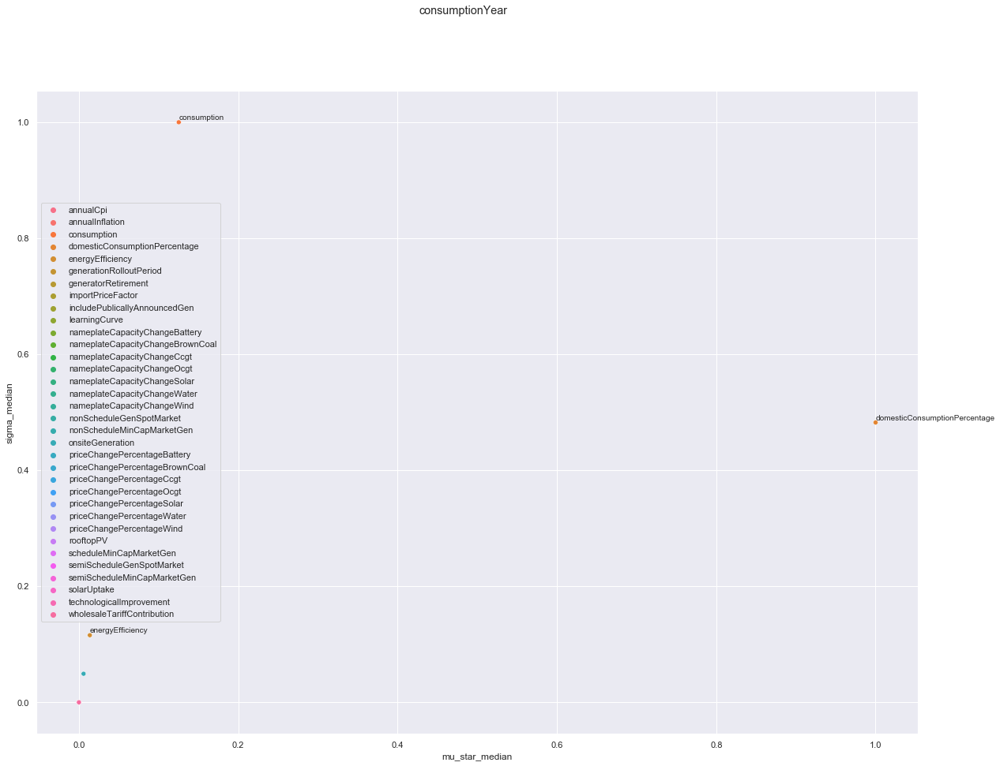

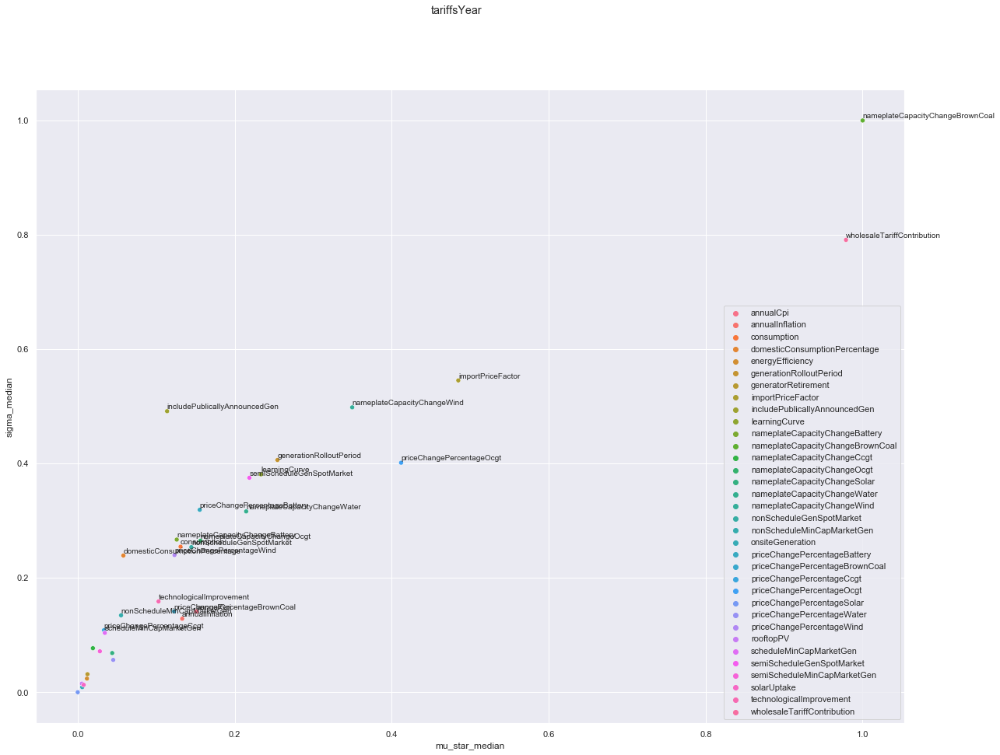

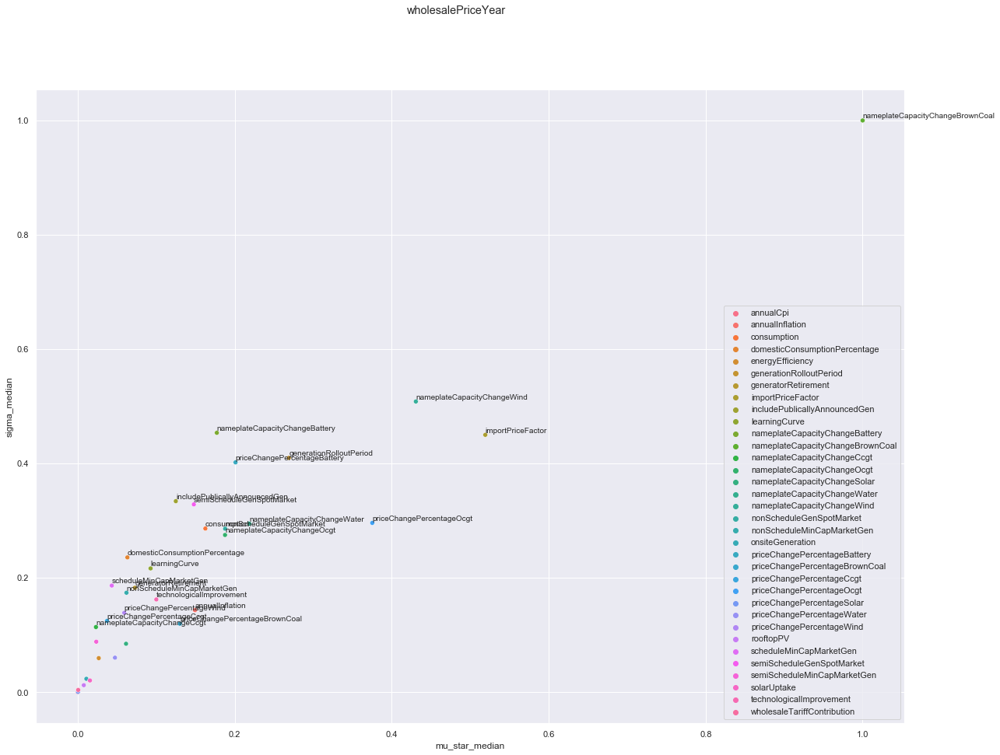

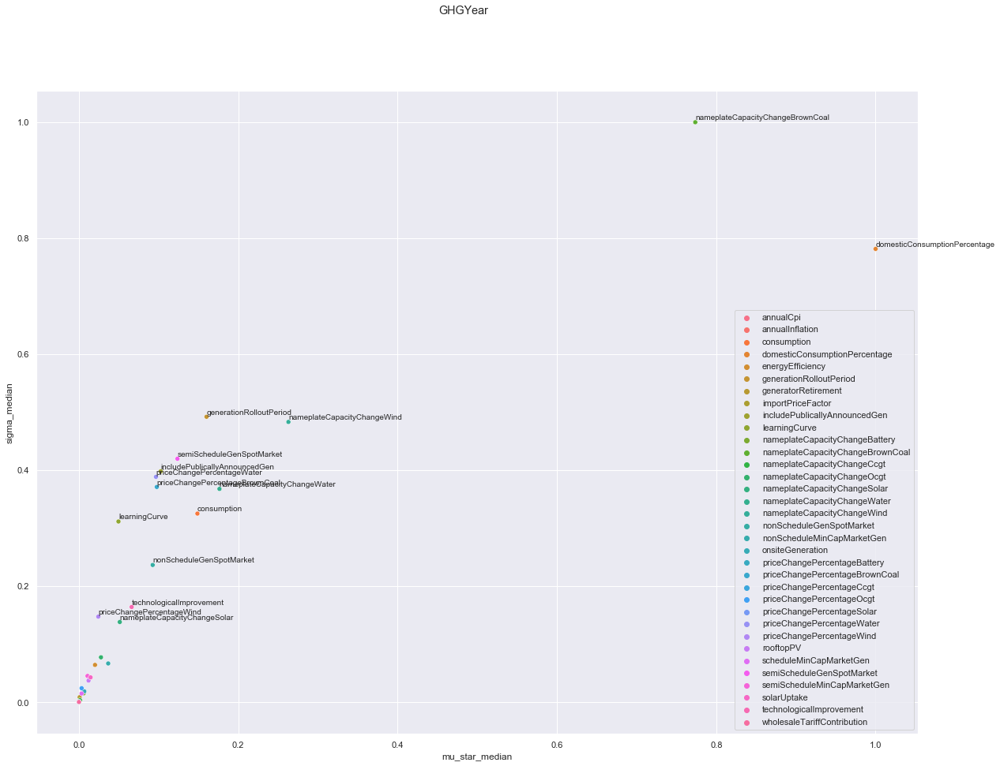

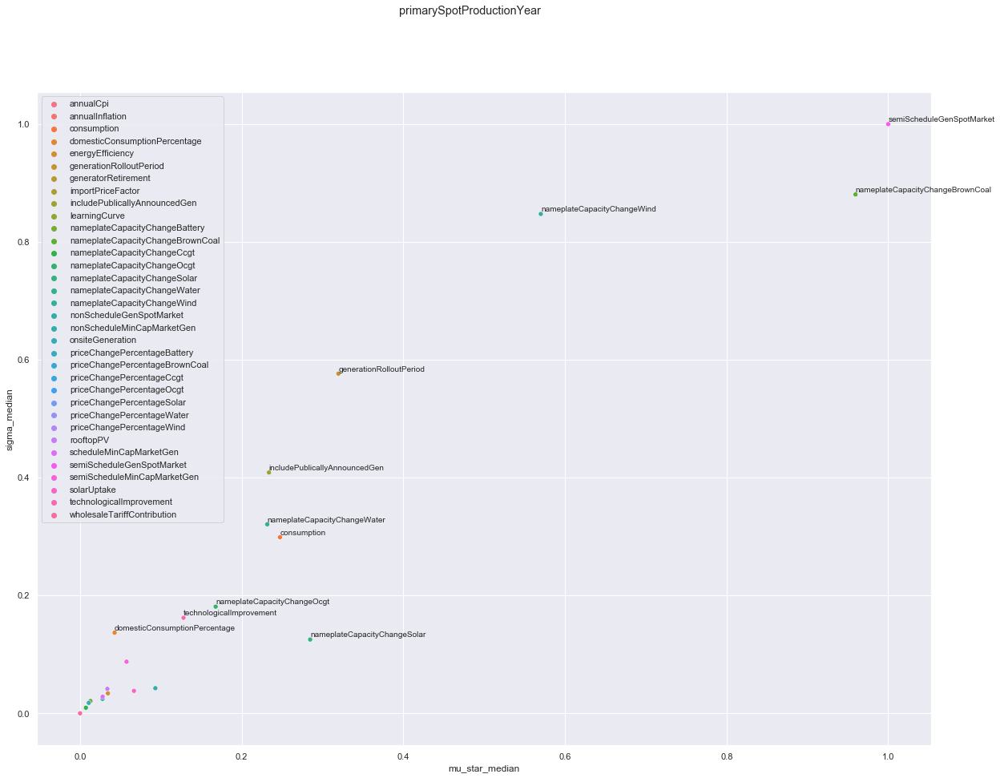

...

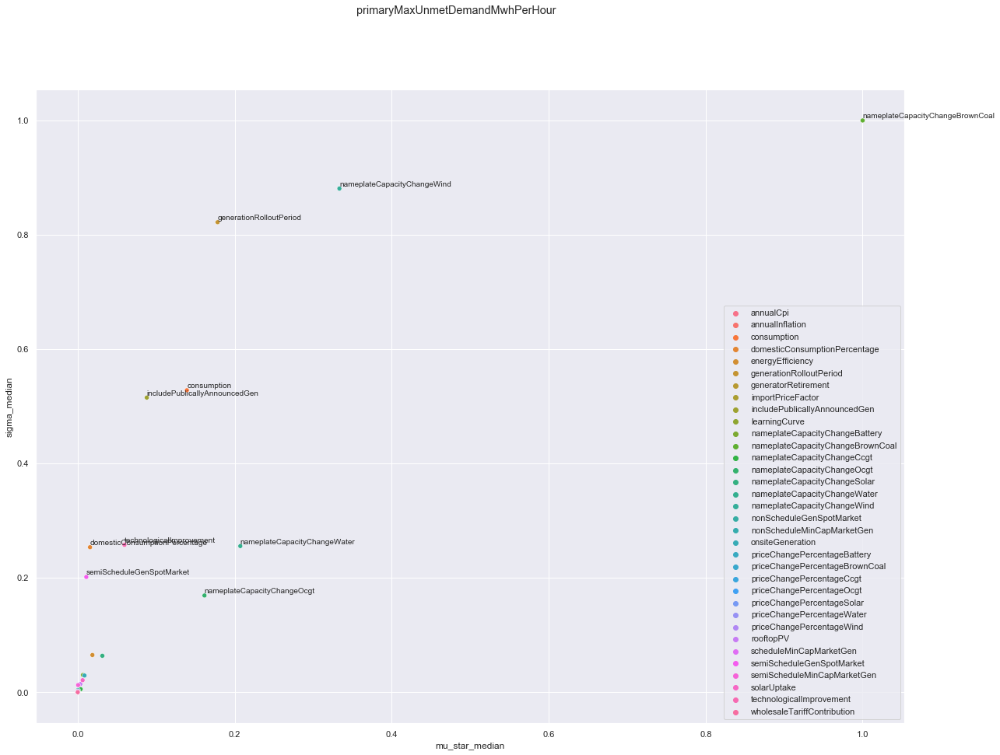

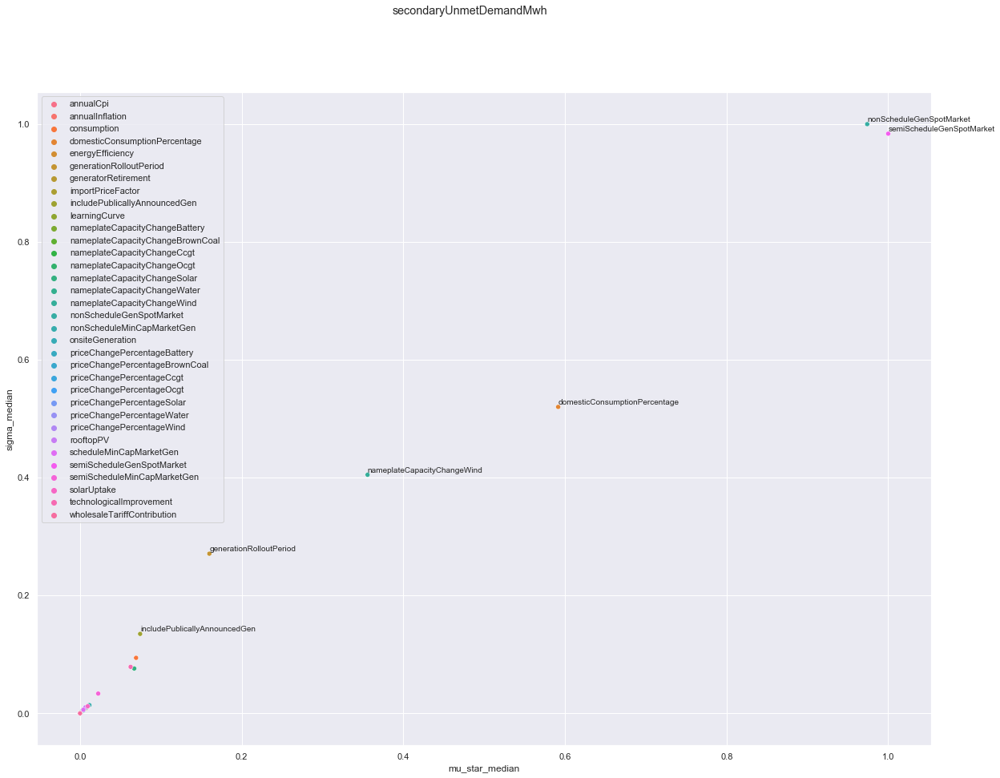

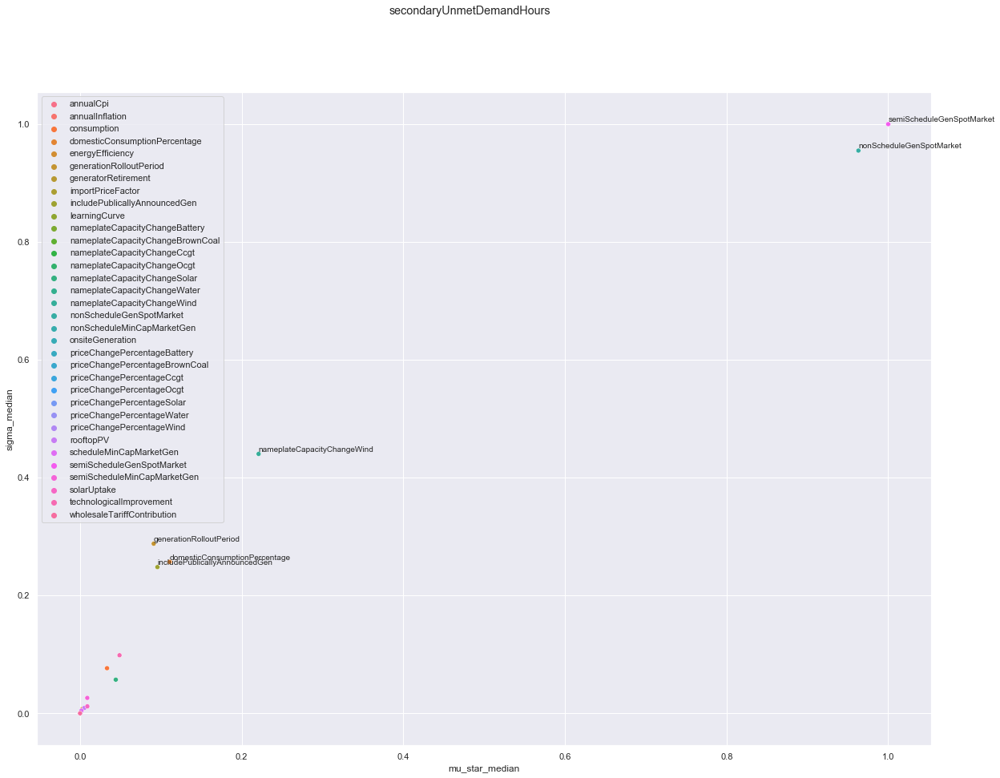

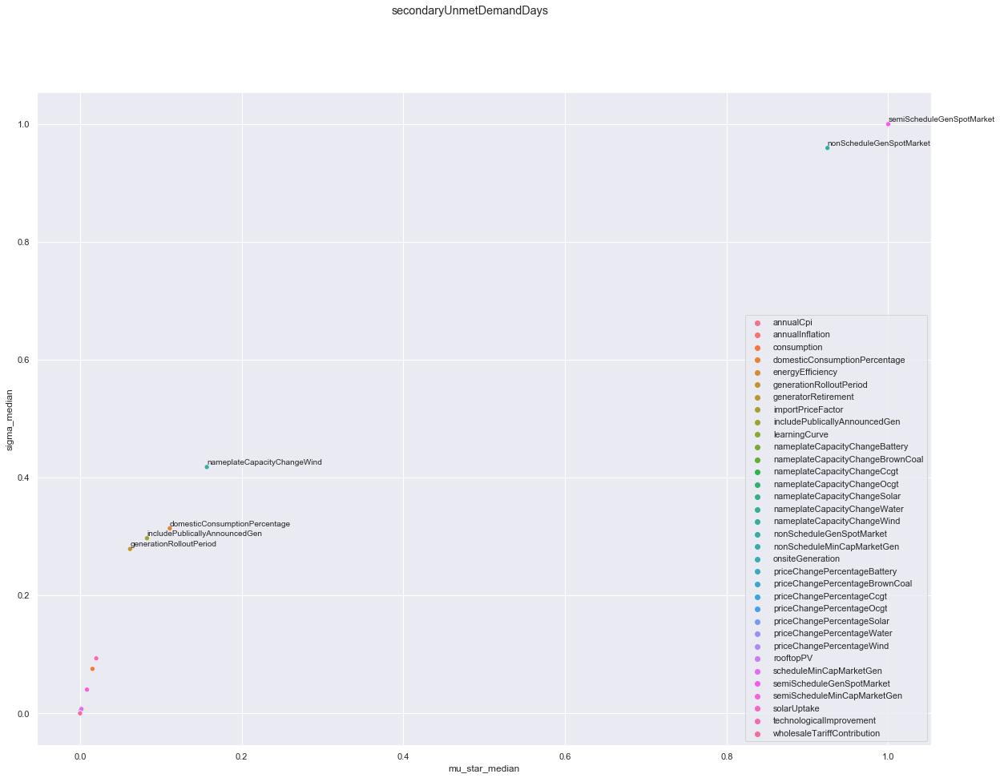

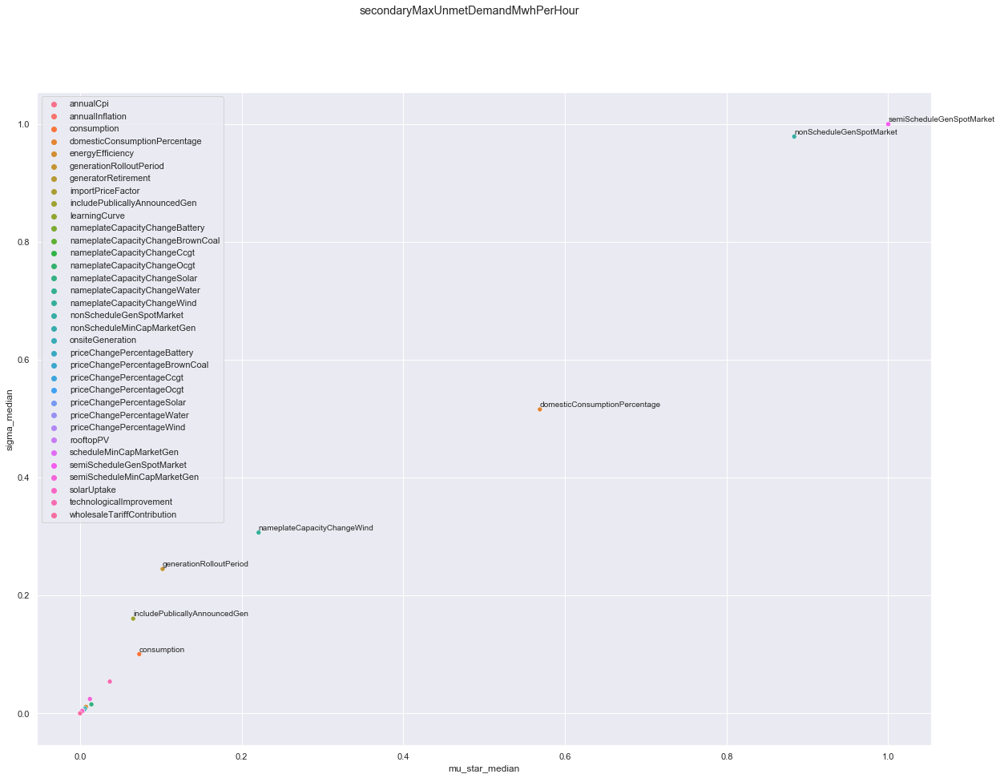

In [34]:
import seaborn as sns; sns.set()
#f = plt.figure(figsize=(20,30)) 
if includePlots:
    for ooi in outcomes_to_show:

        #Normalize values so all graphs are btw 0 and 1. Otherwise cannot use text coordinates below
        normalized_mu_star = ( mu_star_median_ooi[ooi] -  mu_star_median_ooi[ooi].min())/( mu_star_median_ooi[ooi].max() -  mu_star_median_ooi[ooi].min())
        normalized_sigma = (sigma_median_ooi[ooi] - sigma_median_ooi[ooi].min())/(sigma_median_ooi[ooi].max() - sigma_median_ooi[ooi].min())

        df_max = pd.concat({'mu_star_median': normalized_mu_star,'sigma_median': normalized_sigma}, axis=1)

        f=plt.figure(figsize=(20,15))
        f.suptitle(ooi)


        sns.scatterplot(x='mu_star_median',y='sigma_median', hue=df_max.index, data=df_max)

        #df_max.plot.scatter(x='mu_star_max',y='sigma_max',c='DarkBlue')

        #Add labels above points
        for index, row in df_max.iterrows():
                if row['mu_star_median'] <= 0.1 and row['sigma_median'] <= 0.1: continue
                plt.annotate(index, # this is the text
                             (row['mu_star_median'],row['sigma_median']), # this is the point to label
                             textcoords="offset points", # how to position the text
                             xytext=(0,3), # distance from text to points (x,y)
                             ha='left', # horizontal alignment can be left, right or center
                             fontsize=10)  # font size



        print(ooi)

        plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', 'scatter_mu_star_sigmna_median_%s'%(ooi)),dpi=300, bbox_inches='tight')

# f.show()
# f.clear()
# plt.close(f)

### Subset significant factors - normalisation median values
Scatter plots of mu_star vs sigma 

consumptionYear - 2
['consumption' 'domesticConsumptionPercentage']
tariffsYear - 17
['consumption' 'domesticConsumptionPercentage' 'generationRolloutPeriod'
 'importPriceFactor' 'includePublicallyAnnouncedGen' 'learningCurve'
 'nameplateCapacityChangeBattery' 'nameplateCapacityChangeBrownCoal'
 'nameplateCapacityChangeOcgt' 'nameplateCapacityChangeWater'
 'nameplateCapacityChangeWind' 'nonScheduleGenSpotMarket'
 'priceChangePercentageBattery' 'priceChangePercentageOcgt'
 'priceChangePercentageWind' 'semiScheduleGenSpotMarket'
 'wholesaleTariffContribution']
wholesalePriceYear - 15
['consumption' 'domesticConsumptionPercentage' 'generationRolloutPeriod'
 'importPriceFactor' 'includePublicallyAnnouncedGen' 'learningCurve'
 'nameplateCapacityChangeBattery' 'nameplateCapacityChangeBrownCoal'
 'nameplateCapacityChangeOcgt' 'nameplateCapacityChangeWater'
 'nameplateCapacityChangeWind' 'nonScheduleGenSpotMarket'
 'priceChangePercentageBattery' 'priceChangePercentageOcgt'
 'semiScheduleGenSpo

C:\Users\angel\Anaconda3\lib\site-packages\ipykernel_launcher.py:39: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



secondaryUnmetDemandDays - 6
['domesticConsumptionPercentage' 'generationRolloutPeriod'
 'includePublicallyAnnouncedGen' 'nameplateCapacityChangeWind'
 'nonScheduleGenSpotMarket' 'semiScheduleGenSpotMarket']


C:\Users\angel\Anaconda3\lib\site-packages\ipykernel_launcher.py:39: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



secondaryMaxUnmetDemandMwhPerHour - 5
['domesticConsumptionPercentage' 'generationRolloutPeriod'
 'nameplateCapacityChangeWind' 'nonScheduleGenSpotMarket'
 'semiScheduleGenSpotMarket']


C:\Users\angel\Anaconda3\lib\site-packages\ipykernel_launcher.py:39: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



ALL significant inputs (24)
{'nonScheduleGenSpotMarket', 'nameplateCapacityChangeBrownCoal', 'solarUptake', 'nameplateCapacityChangeWind', 'priceChangePercentageBattery', 'wholesaleTariffContribution', 'priceChangePercentageWater', 'consumption', 'nameplateCapacityChangeWater', 'technologicalImprovement', 'semiScheduleGenSpotMarket', 'generationRolloutPeriod', 'nameplateCapacityChangeOcgt', 'domesticConsumptionPercentage', 'learningCurve', 'nonScheduleMinCapMarketGen', 'semiScheduleMinCapMarketGen', 'importPriceFactor', 'nameplateCapacityChangeSolar', 'priceChangePercentageOcgt', 'priceChangePercentageBrownCoal', 'priceChangePercentageWind', 'includePublicallyAnnouncedGen', 'nameplateCapacityChangeBattery'}


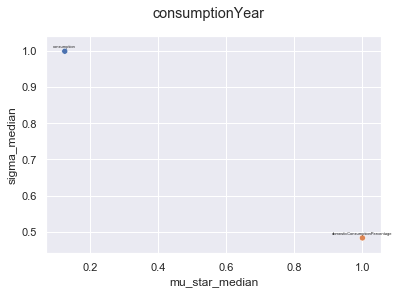

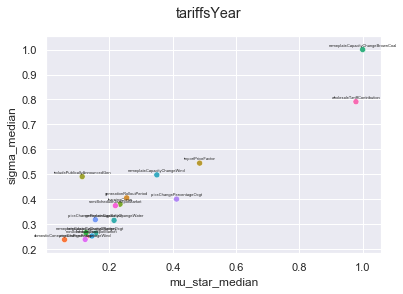

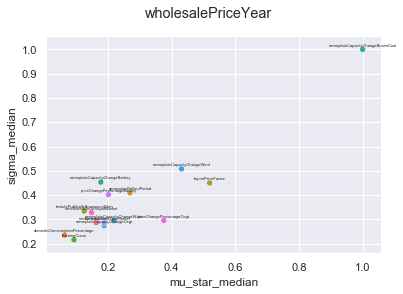

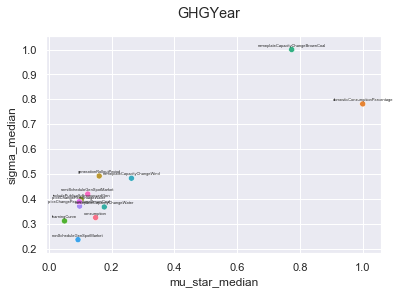

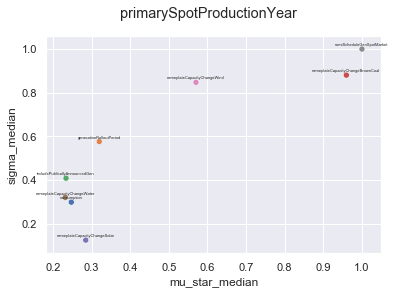

...

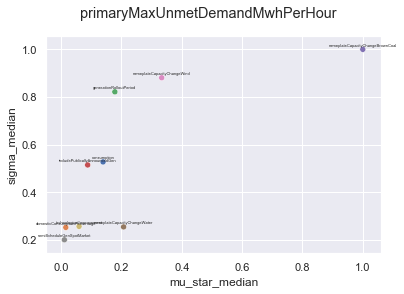

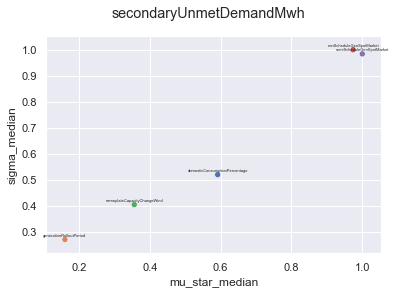

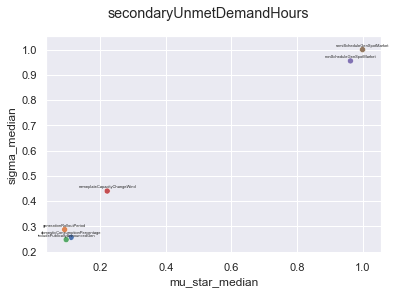

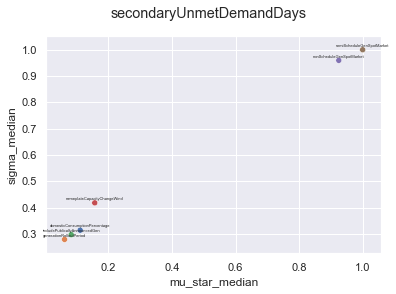

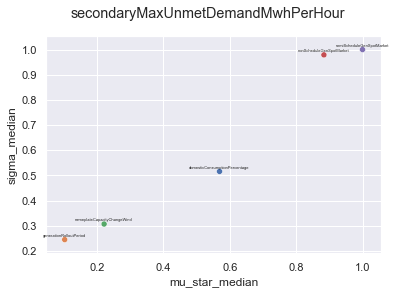

In [35]:
import seaborn as sns; sns.set()
#f = plt.figure(figsize=(20,30)) 

#bound used to filter INPUTS
significance_bound = 0.2
significant_inputs_median = set()
significant_inputs_filter_median = {}
normalized_mu_star_median_ooi = {}
normalized_sigma_median_ooi = {}

for ooi in outcomes_to_show:
    #Normalize values so all graphs are btw 0 and 1. Otherwise cannot use text coordinates below
    normalized_mu_star = (mu_star_median_ooi[ooi] - mu_star_median_ooi[ooi].min())/(mu_star_median_ooi[ooi].max() - mu_star_median_ooi[ooi].min())
    normalized_sigma = (sigma_median_ooi[ooi] - sigma_median_ooi[ooi].min())/(sigma_median_ooi[ooi].max() - sigma_median_ooi[ooi].min())
    normalized_mu_star_median_ooi[ooi] = normalized_mu_star
    normalized_sigma_median_ooi[ooi] = normalized_sigma

    
    #filter values
    filter_mu_star = normalized_mu_star > significance_bound
    filter_sigma = normalized_sigma > significance_bound
    normalized_mu_star_filtered = normalized_mu_star[ filter_mu_star | filter_sigma ]
    normalized_sigma_filtered = normalized_sigma[ filter_mu_star | filter_sigma ] 
    
    #keep track significant inputs filter
    significant_inputs_filter_median[ooi] = normalized_mu_star_filtered.index.values
    for l in normalized_mu_star_filtered.index.values:
        significant_inputs_median.add(l) 
    
    #create dataframe     
    df_max = pd.concat({'mu_star_median': normalized_mu_star_filtered,'sigma_median': normalized_sigma_filtered}, axis=1)
    
    #print significant indexes per ooi
    print(ooi + ' - {}'.format(len(significant_inputs_filter_median[ooi])))
    print(significant_inputs_filter_median[ooi])

    if includePlots:
        #create figure
        f=plt.figure()#figsize=(30,20))
        f.suptitle(ooi)

        #ScatterPlot        
        sns.scatterplot(x='mu_star_median',y='sigma_median', hue=df_max.index, data=df_max, legend=False)


        #Add labels above points
        for index, row in df_max.iterrows():
                plt.annotate(index, # this is the text
                             (row['mu_star_median'],row['sigma_median']), # this is the point to label
                             textcoords="offset points", # how to position the text
                             xytext=(0,3), # distance from text to points (x,y)
                             ha='center', # horizontal alignment can be left, right or center
                             fontsize=4)  # font size



        plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', 'scatter_mu_star_sigmna_median_%s_filtered'%(ooi)),dpi=300, bbox_inches='tight')


print("ALL significant inputs (%d)"%len(significant_inputs_median))
print(significant_inputs_median)

Union of significant factors using max and median values across years

In [36]:
significant_inputs = significant_inputs_max.union(significant_inputs_median)
print("ALL significant inputs Union Max and Median analysis (%d)"%len(significant_inputs))
print(significant_inputs)

significant_inputs = significant_inputs_max
print("ALL significant inputs Max analysis (%d)"%len(significant_inputs))
print(significant_inputs)

significant_inputs = significant_inputs_median
print("ALL significant inputs Median analysis (%d)"%len(significant_inputs))
print(significant_inputs)


ALL significant inputs Union Max and Median analysis (30)
{'nonScheduleGenSpotMarket', 'nameplateCapacityChangeBrownCoal', 'solarUptake', 'nameplateCapacityChangeWind', 'priceChangePercentageBattery', 'generatorRetirement', 'wholesaleTariffContribution', 'priceChangePercentageWater', 'scheduleMinCapMarketGen', 'consumption', 'nameplateCapacityChangeWater', 'technologicalImprovement', 'annualCpi', 'semiScheduleGenSpotMarket', 'generationRolloutPeriod', 'nameplateCapacityChangeOcgt', 'annualInflation', 'domesticConsumptionPercentage', 'learningCurve', 'nonScheduleMinCapMarketGen', 'semiScheduleMinCapMarketGen', 'importPriceFactor', 'nameplateCapacityChangeSolar', 'priceChangePercentageOcgt', 'priceChangePercentageBrownCoal', 'priceChangePercentageWind', 'includePublicallyAnnouncedGen', 'energyEfficiency', 'rooftopPV', 'nameplateCapacityChangeBattery'}
ALL significant inputs Max analysis (29)
{'nonScheduleGenSpotMarket', 'nameplateCapacityChangeBrownCoal', 'solarUptake', 'nameplateCapacit

In [37]:
#save significant factors (max and median) into EXCEL
writer = pd.ExcelWriter('{}/EE_{}.xlsx'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\data', '_significant_max'), engine='xlsxwriter')
significant_inputs_max_df = pd.DataFrame.from_dict(significant_inputs_filter_max,orient='index')
significant_inputs_max_df.to_excel(writer, sheet_name='mu_sigma_max')
writer.save()

writer = pd.ExcelWriter('{}/EE_{}.xlsx'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\data', '_significant_median'), engine='xlsxwriter')
significant_inputs_filter_median_df = pd.DataFrame.from_dict(significant_inputs_filter_median,orient='index')
significant_inputs_filter_median_df.to_excel(writer, sheet_name='mu_sigma_median')
writer.save()


In [38]:
#save mu_star median values into excel
writer = pd.ExcelWriter('{}/EE_{}.xlsx'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\data', 'mu_star_median'), engine='xlsxwriter')
significant_inputs_filter_median_df = pd.DataFrame.from_dict(normalized_mu_star_median_ooi,orient='columns')
significant_inputs_filter_median_df.to_excel(writer, sheet_name='mu_star_median')
writer.save()

writer = pd.ExcelWriter('{}/EE_{}.xlsx'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\data', 'sigma_median'), engine='xlsxwriter')
significant_inputs_filter_median_df = pd.DataFrame.from_dict(normalized_sigma_median_ooi,orient='columns')
significant_inputs_filter_median_df.to_excel(writer, sheet_name='sigma_median')
writer.save()

## Histogram normalizsed $\mu^*$ medians

C:\Users\angel\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\angel\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\angel\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.m

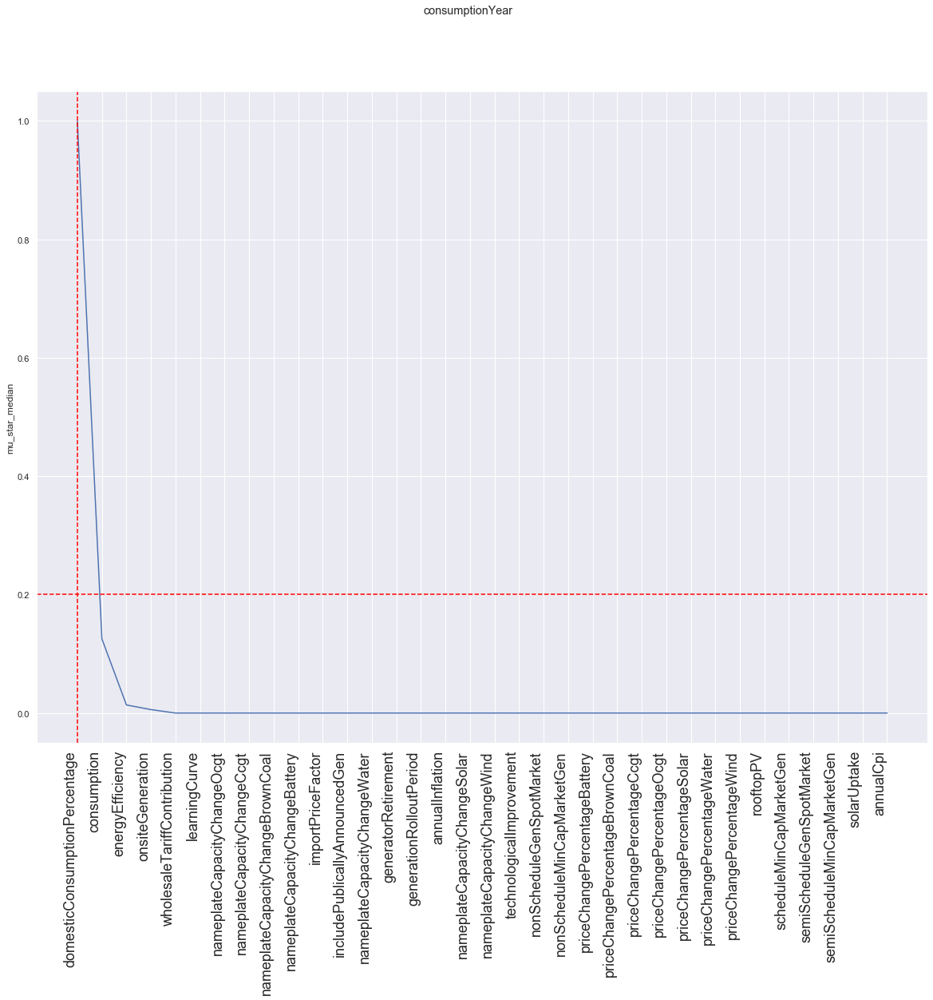

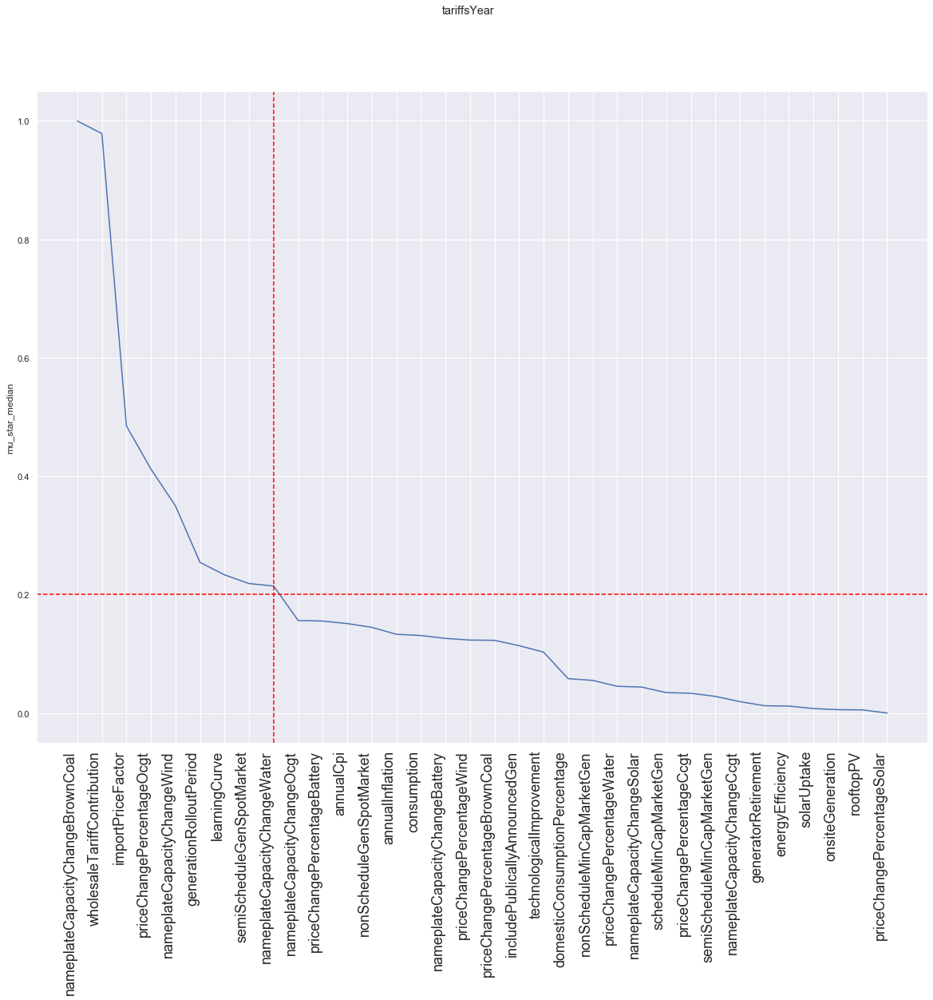

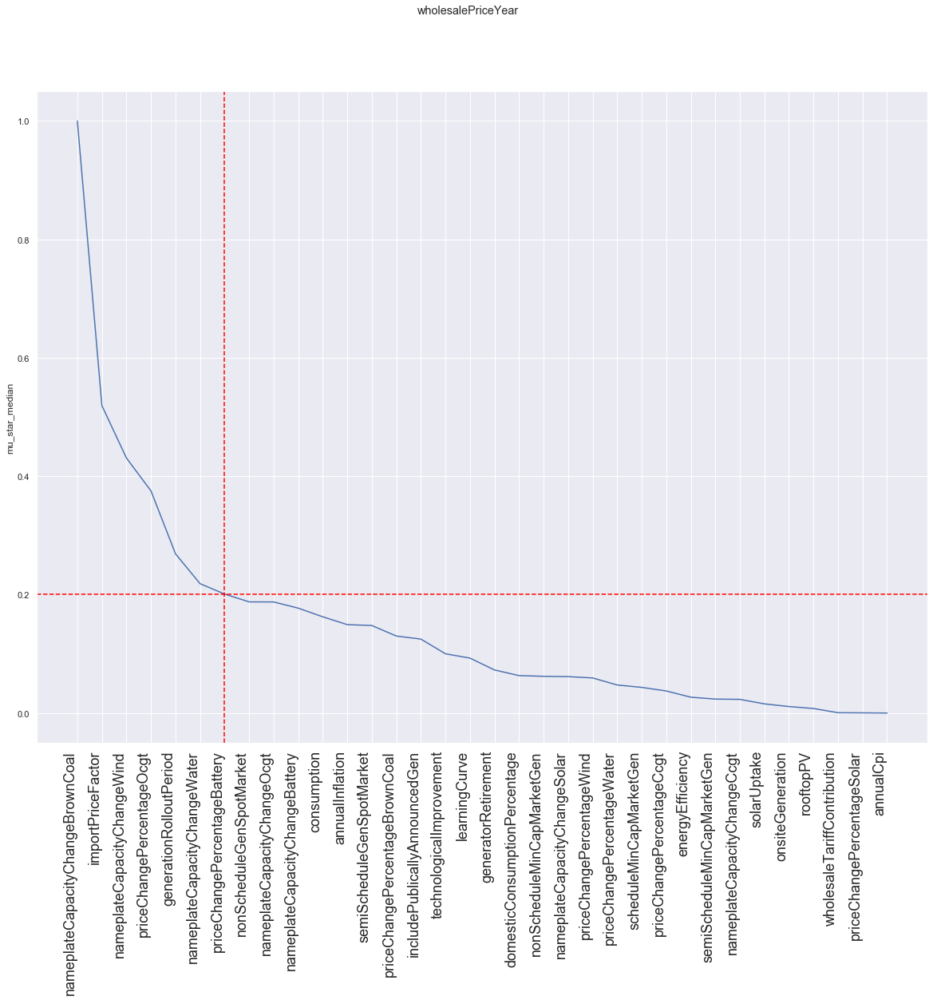

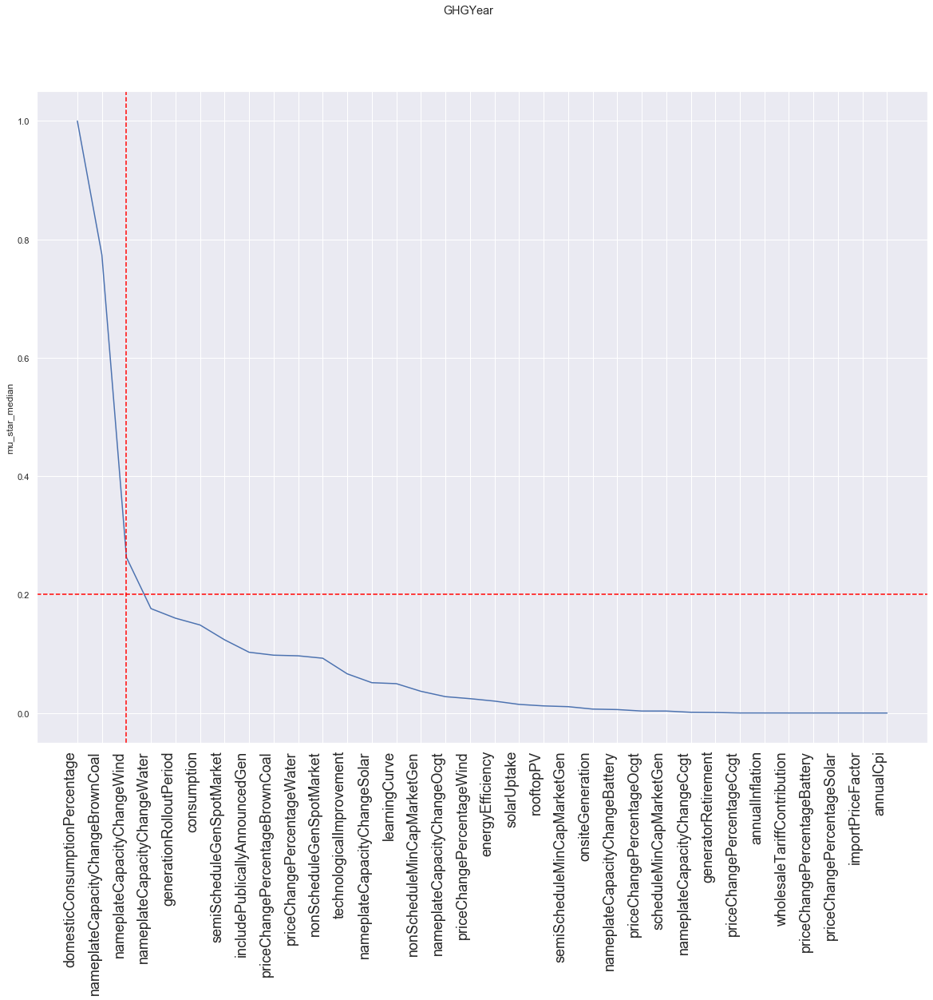

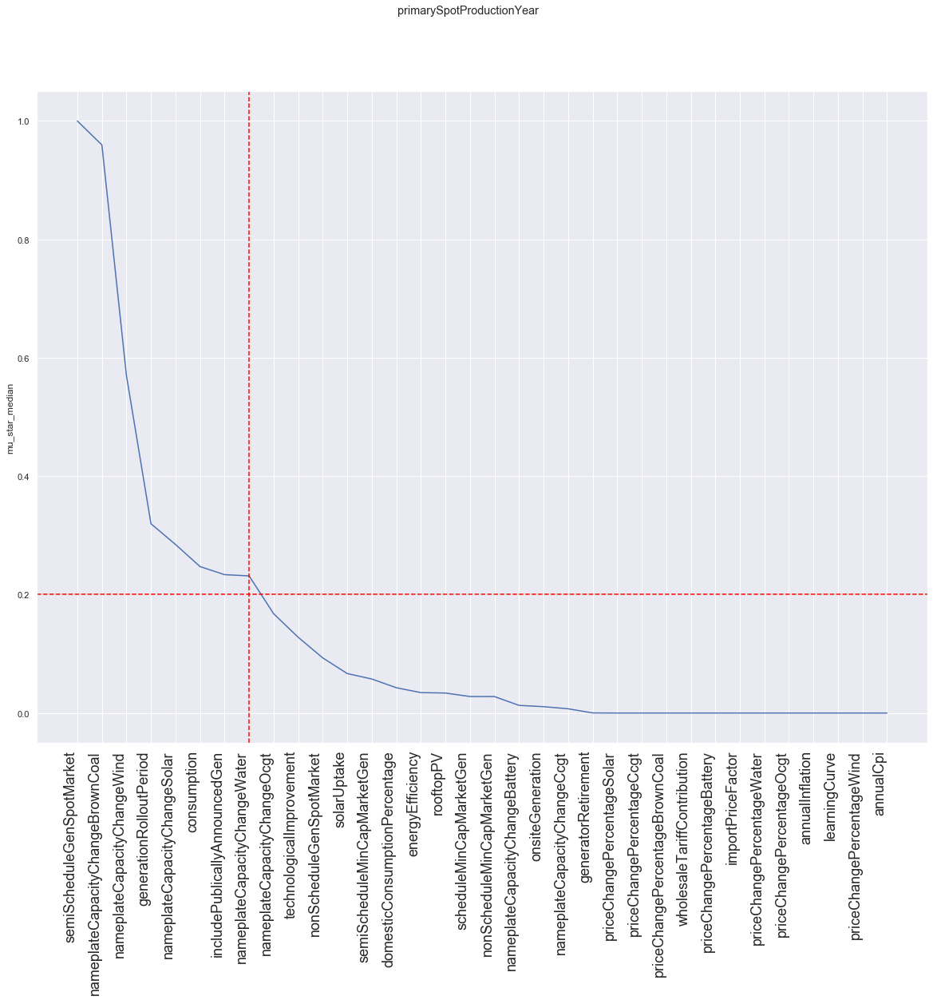

...

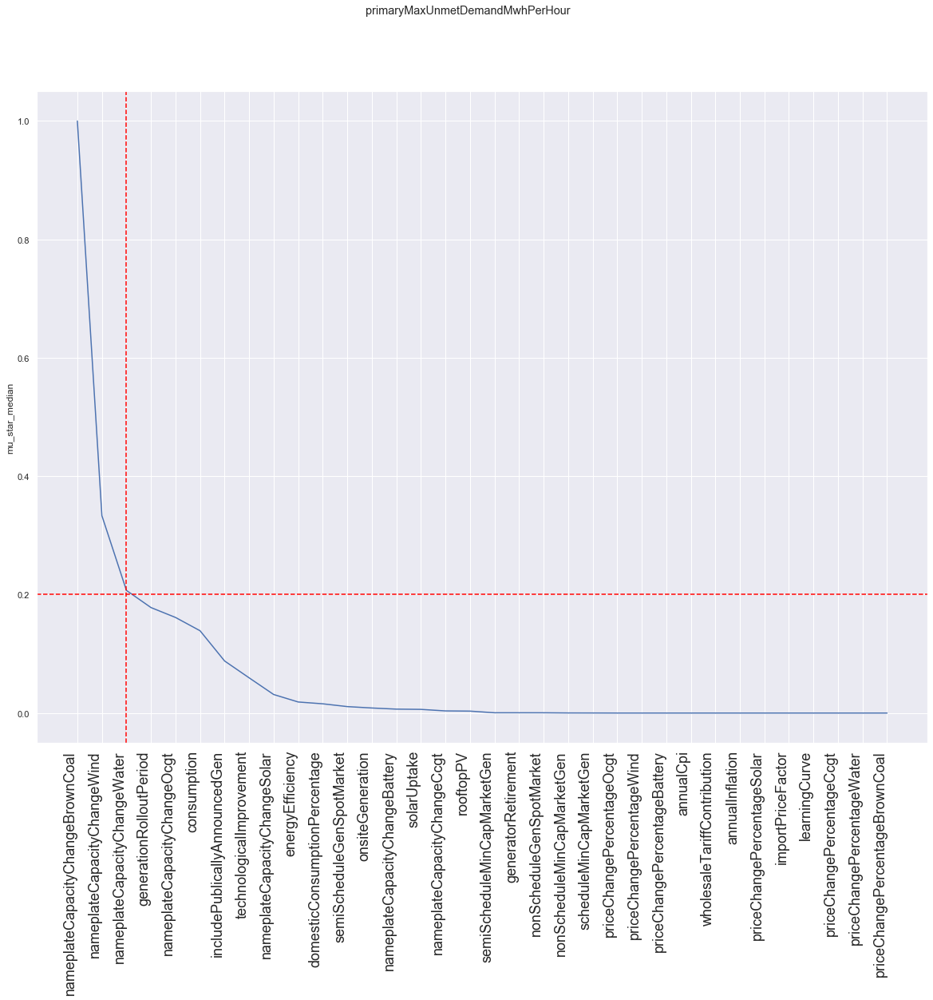

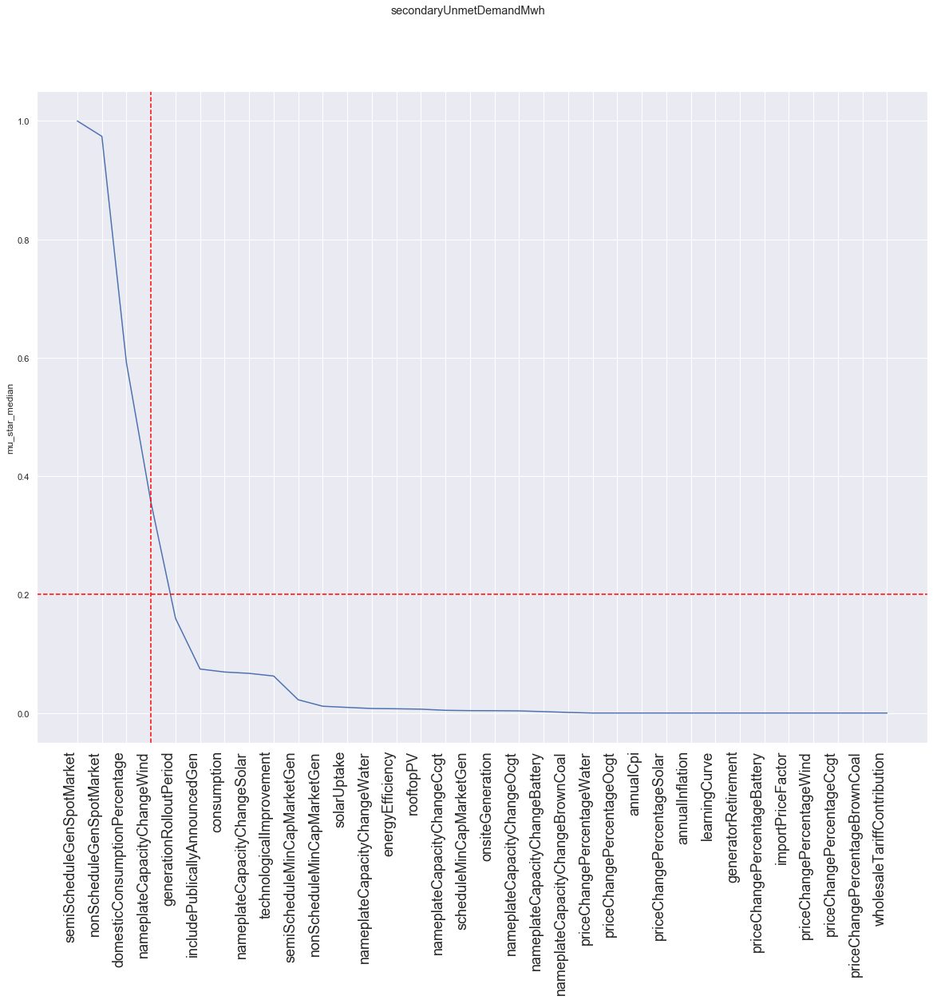

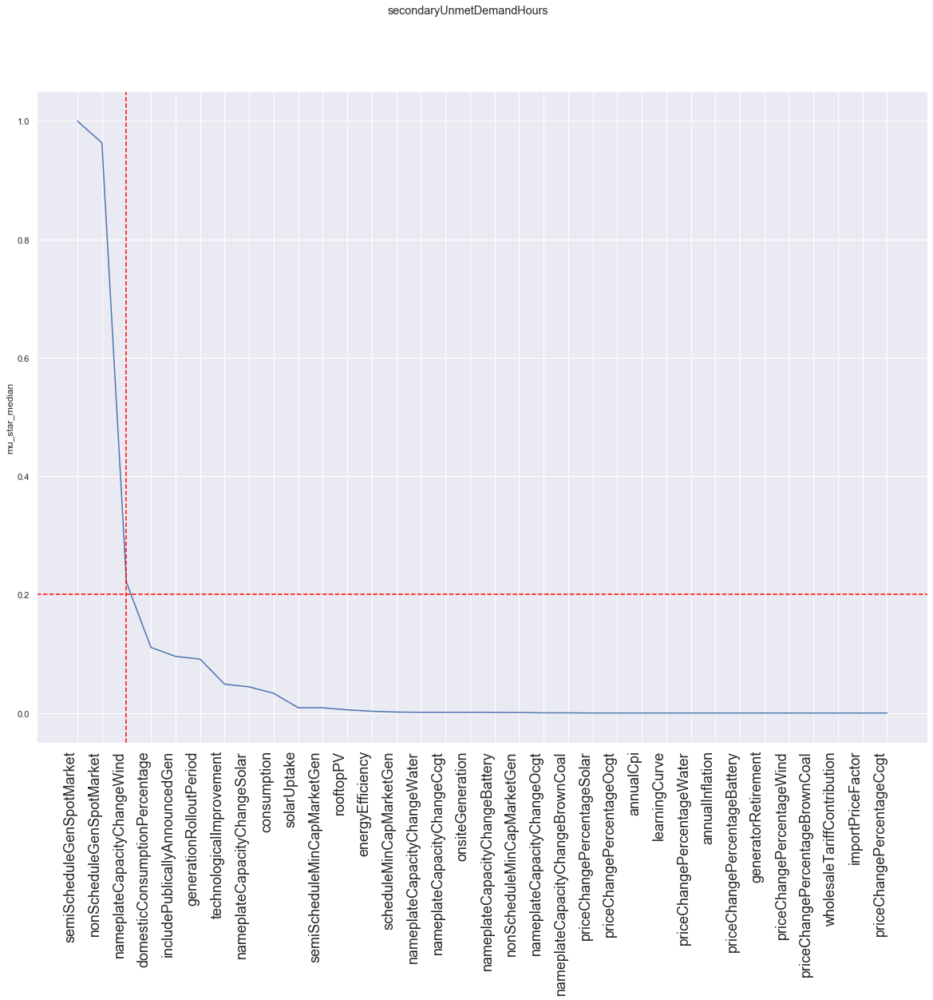

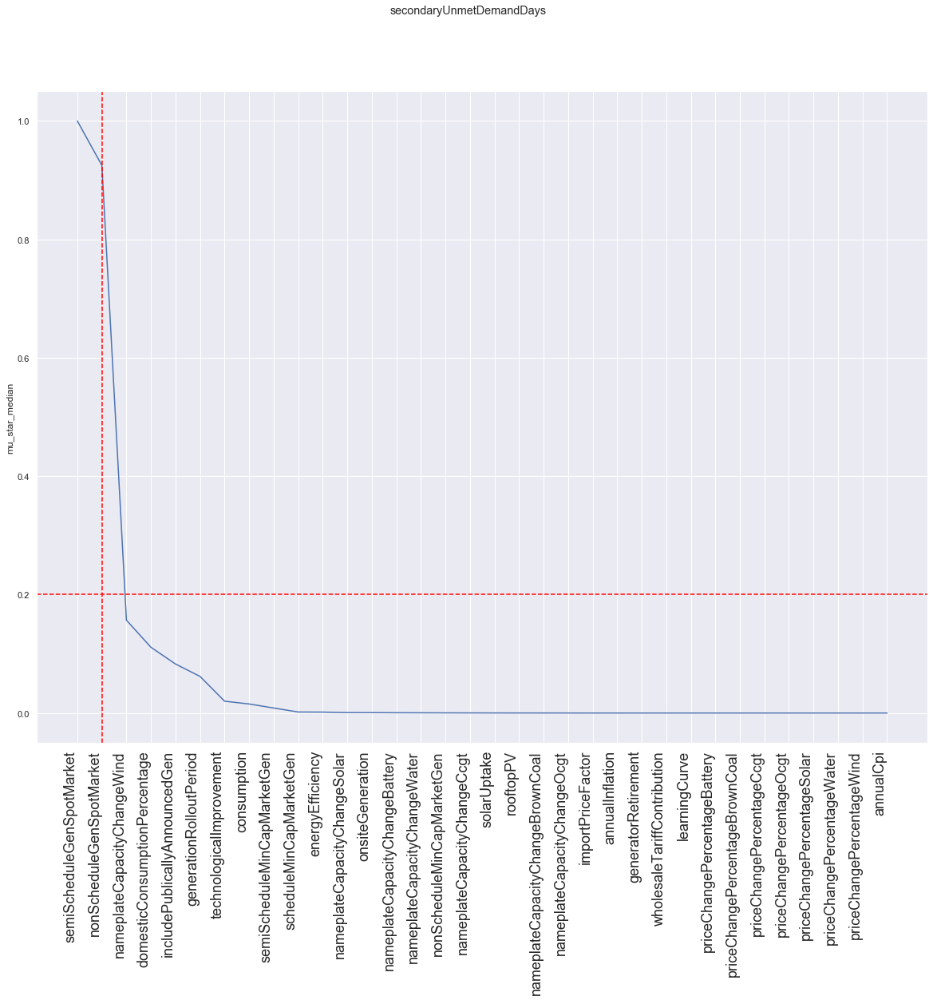

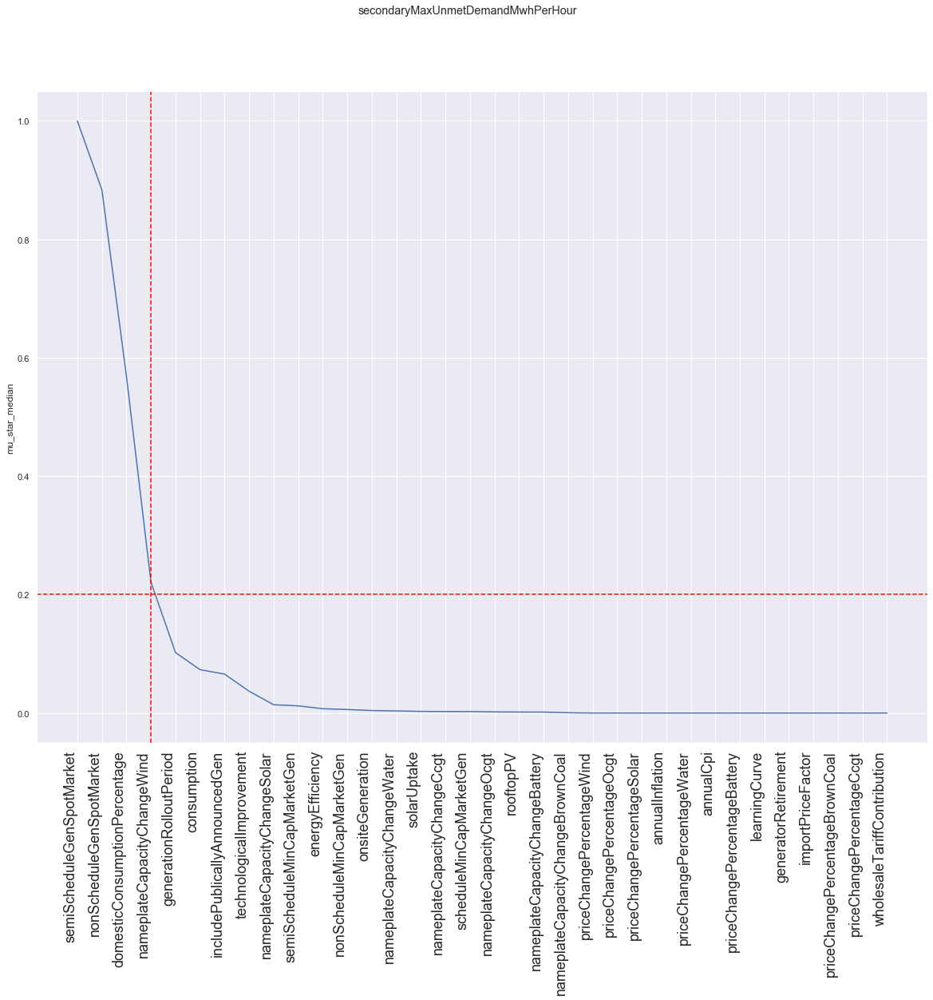

In [39]:
import seaborn as sns; sns.set()
#f = plt.figure(figsize=(20,30)) 

#bound used to filter INPUTS
significance_bound = 0.2
significant_inputs_median = set()
significant_inputs_filter_median = {}
for ooi in outcomes_to_show:
    #Normalize values so all graphs are btw 0 and 1. Otherwise cannot use text coordinates below
    normalized_mu_star = (mu_star_median_ooi[ooi] - mu_star_median_ooi[ooi].min())/(mu_star_median_ooi[ooi].max() - mu_star_median_ooi[ooi].min())
    normalized_sigma = (sigma_median_ooi[ooi] - sigma_median_ooi[ooi].min())/(sigma_median_ooi[ooi].max() - sigma_median_ooi[ooi].min())

    
    #create dataframe     
    df_max = pd.concat({'mu_star_median': normalized_mu_star,'sigma_median': normalized_sigma}, axis=1)

    
    #create figure
    f=plt.figure(figsize=(20,15))
    f.suptitle(ooi)
    
    #ScatterPlot        

    if includePlots:
        eet_plot = sns.lineplot(data=df_max['mu_star_median'].sort_values(ascending=False), markers=True)

        vertical_line = ''
        for item in eet_plot.get_xticklabels():
            item.set_rotation(90)
            item.set_horizontalalignment('right')
            item.set_fontsize(18)

        eet_plot.axhline(significance_bound,ls='--',color='red')
        
        if True in (normalized_mu_star > significance_bound).value_counts():
            vertical_line = (normalized_mu_star > significance_bound).value_counts()[True] - 1
            eet_plot.axvline( vertical_line ,ls='--',color='red')


        plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', 'ranking_mu_star_median_%s'%(ooi)),dpi=300, bbox_inches='tight')


# print("ALL significant inputs (%d)"%len(significant_inputs_median))
# print(significant_inputs_median)

## Boxplot

In [ ]:
# index = pd.to_datetime(time, format = '%Y')

# for ooi in outcomes_to_show:
#     data = outcomes[ooi][:, startYearShift:]
    
   
#     for u in uncertainties:
#         dfBoxPlot = pd.DataFrame(index = index, data = data.T,columns=[ experiments[u] ])
#         dfMeltdfBoxPlot = pd.melt(dfBoxPlot)
#         #dfMeltdfBoxPlot.rename(columns={"value":ooi})
    
#         ax = dfMeltdfBoxPlot.boxplot(by=u, meanline=True, showmeans=False, showcaps=True, 
#                         showbox=True, showfliers=False, return_type='axes', figsize=(15, 10))
        
        
#         plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_eet_boxplots_%s_%s'%(ooi,u)), 
#                      dpi=300, bbox_inches='tight')
        
       
#         plt.show()
#         plt.close()
